In [ ]:
from datascience import *
!pip install matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.font_manager as fm

# Colab 進行matplotlib繪圖時顯示繁體中文
# 下載台北思源黑體並命名taipei_sans_tc_beta.ttf，移至指定路徑
!wget -O TaipeiSansTCBeta-Regular.ttf https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_&export=download

import matplotlib as mpl
from matplotlib.font_manager import fontManager

fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
mpl.rc('font', family='Taipei Sans TC Beta')

--2023-11-15 12:02:58--  https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_
Resolving drive.google.com (drive.google.com)... 74.125.132.138, 74.125.132.102, 74.125.132.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.132.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0k-9o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uofsbk290tkbsad3n3igodqot3cau2r2/1700049750000/02847987870453524430/*/1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_?uuid=9e5e4b06-3d85-4014-862d-66f40427496f [following]
--2023-11-15 12:02:59--  https://doc-0k-9o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uofsbk290tkbsad3n3igodqot3cau2r2/1700049750000/02847987870453524430/*/1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_?uuid=9e5e4b06-3d85-4014-862d-66f40427496f
Resolving doc-0k-9o-docs.googleusercontent.com (doc-0k-9o-docs.googleusercontent.com)... 172.253.119.132, 2607:f8b0:4001:c23::84
Connecting to doc-0

利用學生學習平均成績以及學生選課成績資料判斷卷哥卷姐選擇那些課程。
我們採用學號為primary key。
(目前決定先不採用研究所)
書卷獎獎勵對象為各學系大學部各班前一學期學業成績名列該班前百分之
五(四捨五入計算至整數)且未受任何處分之在學學生。

In [ ]:
import pandas as pd

# 讀取CSV文件
url = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df = pd.read_csv(url)

# 排除掉系所名稱中包含'博士班'、'碩士在職專班'和'碩士班'的資料
df_filtered = df[~df['系所名稱'].str.contains('博士班|碩士在職專班|碩士班|博士學位學程')]

# 確保'學期-班一般人數'列是數字類型
df_filtered['學期-班一般人數'] = pd.to_numeric(df_filtered['學期-班一般人數'], errors='coerce')

# 處理NaN值，例如用0替換或者刪除含有NaN的行
df_filtered = df_filtered.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

#NaN


# 創建一個空的DataFrame來儲存結果
top_students = pd.DataFrame()

# 對每個系的每個年級進行迭代，找出前5%的學生
for (dept, year_class), group in df_filtered.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)  # 獲取該系年級應該選取的學生數量，至少1人
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')  # 獲取成績前5%的學生
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)

# 按照年級班別降序排序
top_students_sorted = top_students.sort_values('年級班別', ascending=False)

# 追蹤當前的年級班別
current_year_class = None

# 印出學號，並在年級班別變化時印出新的年級班別
for index, row in top_students_sorted.iterrows():
    if current_year_class != row['年級班別']:
        current_year_class = row['年級班別']
        print(f"年級班別: {current_year_class}")
    print(row['學號'])



<ipython-input-2-0c041049b6f5>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['學期-班一般人數'] = pd.to_numeric(df_filtered['學期-班一般人數'], errors='coerce')


年級班別: 4年級3班
17219ee218331706e28c51182fbd833c628601a3056d6d75737923f7992dba0b
6b5d1037509d301a3b07b179164f4ef0cde43c4784d2114a2147a1603562856a
9d479df532a7d91db6e09890046e2e4eaaa65302378122c3bf38030998ebc2f9
年級班別: 4年級2班
b1d1ee198605f0fc65ae1611a7d3721e022bb9ff65ca866905ec45405aaf9fc5
191ce82d094435924fe8d12148fa2829b54f9b15236cf3569786ae78f289ba6b
edd6b5ddf06148ceaf92d9490136fdf23886251e810a09654d4baf6bc725aa19
9f9bfc5208925830a3bc41a04462f7bfea5ebbf78e0d39796a12a06b6e1907eb
850911210c584ed906f25614d8ff88c298bc84b9f22a592d585f552da67b9e44
4209baea59874d4ed7100446b13864a893712ca69fddf98db0149033f1ca6b42
5263d095c6e06cae634b600e7bb35890eab0cd9bda3ebc37d408ffab16f2f8cf
de8da3d5b8447d30ad0509e90dbadbf38e41ab75f0e1b5463b385a0947fbed94
86f1f778a7176c7178c459f44c9d57fe7f4797f69d0b5ed5b69cc82b20dfbd1e
21e74adda279a0ee9a5702ea89037aff0542a9a29e0d2059a754738ac888074f
71a3703daf65a9661d73a463ddfae24f2e3e357d3d85b71468e138a63e835353
604c5f5b8d6101492472003850d6563ee2da0e040833aed88e4a714f80a7d200
b

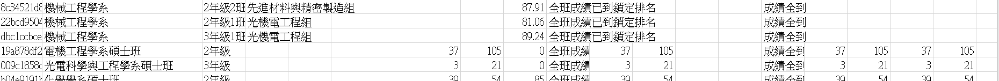


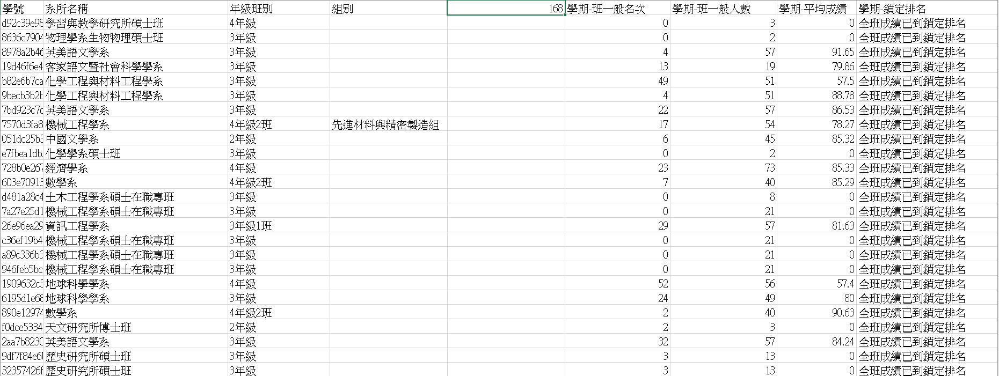

由於範圍太大，將學號結合選課資料呈現出來是不容易的，並且每個學院的必修不同所以，故我們先以管理學院企業管理系一年級的卷哥來研究，之後再擴大為同系不同年級，不同系同同年級，不同學院。以下是企管系的書卷獎得主之學號以及對應的年級。


In [ ]:
import pandas as pd

# 讀取CSV文件
url = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df = pd.read_csv(url)

# 篩選出企業管理學系1年級1班和1年級2班的資料
df_filtered = df[(df['系所名稱'] == '企業管理學系') ]
# & (df['年級班別'].isin(['1年級1班', '1年級2班']))]

# 確保'學期-班一般人數'列是數字類型
df_filtered['學期-班一般人數'] = pd.to_numeric(df_filtered['學期-班一般人數'], errors='coerce')

# 處理NaN值，例如用0替換或者刪除含有NaN的行
df_filtered = df_filtered.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 創建一個空的DataFrame來儲存結果
top_students = pd.DataFrame()

# 對企業管理學系1年級1班和1年級2班進行迭代，找出前5%的學生
for (dept, year_class), group in df_filtered.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)  # 獲取該系年級應該選取的學生數量，至少1人
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')  # 獲取成績前5%的學生
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)

# 印出學號
for index, row in top_students.iterrows():
    print(f"年級班別: {row['年級班別']}，學號: {row['學號']}")

年級班別: 1年級1班，學號: 9e3b9ef3f225ac16afb81d2e0ea34ee51644ed6774850b7d3b54c6cb3d639622
年級班別: 1年級1班，學號: 6e86aa4d8503522c57ea2d3a3aa196d057a8d593d7fd31450c89e54dfe97c453
年級班別: 1年級1班，學號: a286d34cdab17620b55cf38bb37002e3cba719d37c49ffb27df207a9125948cc
年級班別: 1年級2班，學號: 02808c7ec1c82aac497c6f34180dfc8e28133a074e2e89532d3999b872da3412
年級班別: 1年級2班，學號: 13d4d271779097e496d628f8aea7dc7346d58aa2ff77282aaac9a149f04de7a2
年級班別: 1年級2班，學號: c00ba5d2b3e00fa51b2d0993d0896037b2e0e2b48995b070d047a3ec94a2436b
年級班別: 2年級1班，學號: 243e0b67bd85ae3308482494f58295ae1f58ec775da2003b5fc01980aeff1f23
年級班別: 2年級1班，學號: e150c3245190537b4ac25f62902770d3c198939f84a7b7101612eb96879e0c08
年級班別: 2年級1班，學號: 61d27073c4f006fc35816ed1bb490ef17070647c6f238aeb813b7ea13a916477
年級班別: 2年級2班，學號: cae5d2b9b933b9b6afe043254177eba0608d9c8990db0295bb4f42f0efeb1f40
年級班別: 2年級2班，學號: a006f9da3ced4515ccd886f9d2ac242ea1fc547fdfea799d0921d4214d226231
年級班別: 2年級2班，學號: 934a8fe318c7559def29b1334733681dd6e6753e2441957663bbcad6d9d6a5fb
年級班別: 3年級1班，學號: 94b1b0391f83

<ipython-input-3-45b9134e81dd>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['學期-班一般人數'] = pd.to_numeric(df_filtered['學期-班一般人數'], errors='coerce')


我們針對學號去搜尋企管系1年級書卷獎得主所修習的課程。

In [ ]:
import pandas as pd

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出企業管理學系1年級1班和1年級2班的資料
df_filtered_1 = df_1[(df_1['系所名稱'] == '企業管理學系') ]
# & (df_1['年級班別'].isin(['1年級1班', '1年級2班']))]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號
top_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]

# 印出學號對應的課程名稱和學分數
for index, row in selected_courses.iterrows():
    print(f"學號: {row['學號']}, 課程名稱: {row['課程名稱']}")


<ipython-input-4-d8721e8a4b61>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


學號: 71a3703daf65a9661d73a463ddfae24f2e3e357d3d85b71468e138a63e835353, 課程名稱: 投資學
學號: 2648d56a60f7ff6ed789fe5e8f09c08b5f79aee1158ba5746edbed344fdf7a23, 課程名稱: 投資學
學號: 354d52ee19be3c125cf76061d75dae466f2c214a68c2343e38238424fa056972, 課程名稱: 電子與資訊產業概論
學號: de8da3d5b8447d30ad0509e90dbadbf38e41ab75f0e1b5463b385a0947fbed94, 課程名稱: ERP財務會計模組
學號: 5fdb182da43124411dee1832448cf7c30bc1aef27c9f7e8279c6158bbf71743e, 課程名稱: 法學緒論
學號: 2648d56a60f7ff6ed789fe5e8f09c08b5f79aee1158ba5746edbed344fdf7a23, 課程名稱: 債券市場
學號: 354d52ee19be3c125cf76061d75dae466f2c214a68c2343e38238424fa056972, 課程名稱: 策略行銷
學號: 604c5f5b8d6101492472003850d6563ee2da0e040833aed88e4a714f80a7d200, 課程名稱: 日文(一)A
學號: 2648d56a60f7ff6ed789fe5e8f09c08b5f79aee1158ba5746edbed344fdf7a23, 課程名稱: 電子與資訊產業概論
學號: de8da3d5b8447d30ad0509e90dbadbf38e41ab75f0e1b5463b385a0947fbed94, 課程名稱: 電子與資訊產業概論
學號: 5fdb182da43124411dee1832448cf7c30bc1aef27c9f7e8279c6158bbf71743e, 課程名稱: 中級會計學I
學號: 2648d56a60f7ff6ed789fe5e8f09c08b5f79aee1158ba5746edbed344fdf7a23, 課程名稱: ERP企業流程管理
學

我們針對學號去搜尋企管系1年級書卷獎得主所修習的課程畫出長條圖，其中，我們以選課比例為x軸，課程名稱為y軸，並排除必修課，試圖找出選修那些課程有較多書院獎得主選擇。
根據所繪製出來的圖我們可以看到最多書卷得主選擇的是企業資源規劃。

<ipython-input-5-c706e1668ea4>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


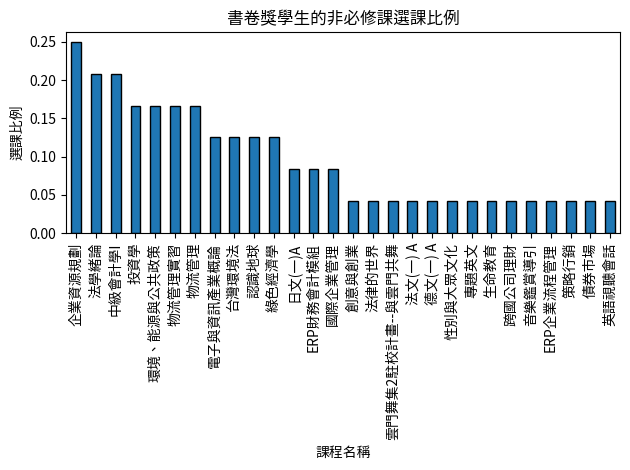

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出企業管理學系所有年級的資料
df_filtered_1 = df_1[(df_1['系所名稱'] == '企業管理學系') ]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號
top_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]

# 計算每門課程被選擇的次數
course_counts = selected_courses['課程名稱'].value_counts()

# 計算所有前5%學生的總數
total_top_students = len(top_student_ids)

# 計算比例
course_proportions = course_counts / total_top_students

# 繪製柱狀圖
course_proportions.plot(kind='bar')
plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('書卷獎學生的非必修課選課比例')
plt.xticks(rotation=90)  # 將x軸標籤旋轉90度以便閱讀
plt.tight_layout()  # 調整布局
plt.show()


書卷獎得主(前5%的學生)與排名後5%的學生進行比較。
敘述性統計：前5%的學生選課的主題較為集中。後5%學生的選課行為較為分散。

(目前不確定是否具有意義，需要統計數據佐證。)

<ipython-input-6-af410920a4a9>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


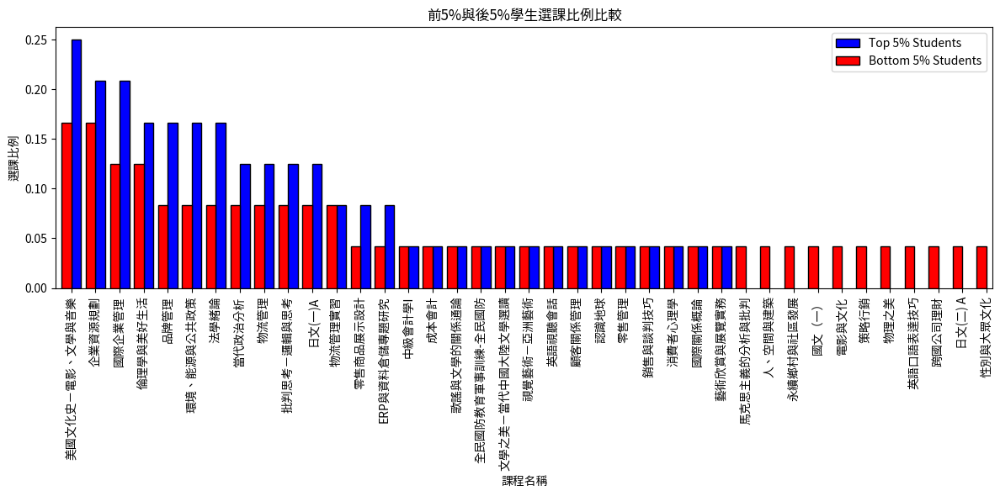

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出機械工程學系所有年級的資料
df_filtered_1 = df_1[(df_1['系所名稱'] == '企業管理學系')]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%和後5%的學生學號
top_students = pd.DataFrame()
bottom_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    bottom_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    bottom_students_in_group = group.nlargest(bottom_n, '學期-班一般名次')
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    bottom_students = pd.concat([bottom_students, bottom_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
bottom_student_ids = bottom_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]
selected_courses_bottom = df_2[(df_2['學號'].isin(bottom_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]


# 計算所有前5%學生和後5%學生的總數
total_top_students = len(top_student_ids)
total_bottom_students = len(bottom_student_ids)

# Count the number of courses selected by top and bottom students
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_bottom = selected_courses_bottom['課程名稱'].value_counts()
# 計算比例
course_proportions_top = course_counts_top / total_top_students
course_proportions_bottom = course_counts_bottom / total_bottom_students

# 繪製柱狀圖
fig, ax = plt.subplots(figsize=(12, 6))
course_proportions_top.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
course_proportions_bottom.plot(kind='bar', color='red', position=1, width=0.4, label='Bottom 5% Students')
plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('前5%與後5%學生選課比例比較')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


以下為企管系書卷獎得主與後95%同學的選課方式比較，此部分可以與下一段程式碼進行比較。

<ipython-input-7-ad67f50675da>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


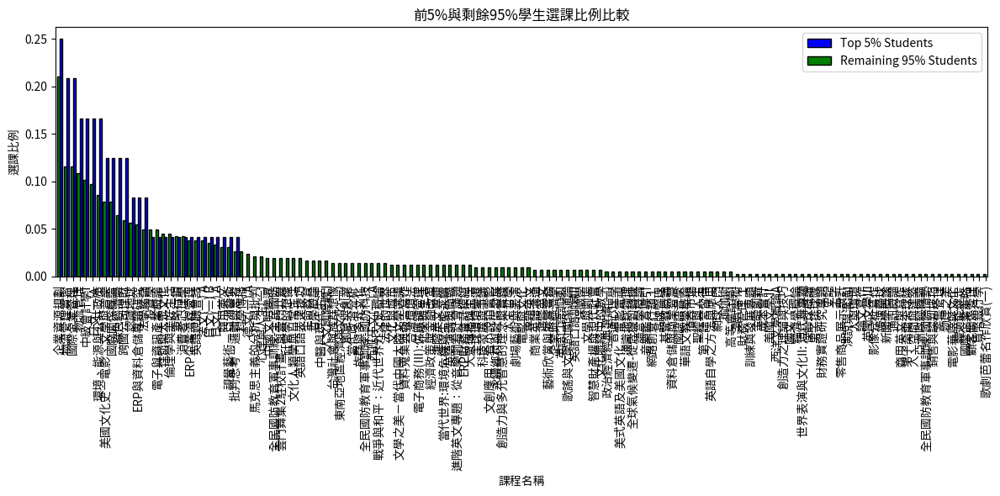

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出企業管理學系所有年級的資料
df_filtered_1 = df_1[(df_1['系所名稱'] == '企業管理學系')]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號
top_students = pd.DataFrame()
remaining_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    remaining_students_in_group = group.iloc[top_n:]  # 剩餘的95%學生
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
remaining_student_ids = remaining_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]
selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]

# 計算每門課程被選擇的次數
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

# 計算所有前5%學生和剩餘95%學生的總數
total_top_students = len(top_student_ids)
total_remaining_students = len(remaining_student_ids)

# 計算比例
course_proportions_top = course_counts_top / total_top_students
course_proportions_remaining = course_counts_remaining / total_remaining_students

# 繪製柱狀圖
fig, ax = plt.subplots(figsize=(12, 6))
course_proportions_top.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
course_proportions_remaining.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')
plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('前5%與剩餘95%學生選課比例比較')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


本段的程式碼為分析兩組學生共同選擇的課程，此部分可以繼續分析進行一些發揮。

<ipython-input-8-c36a37b1dbe8>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


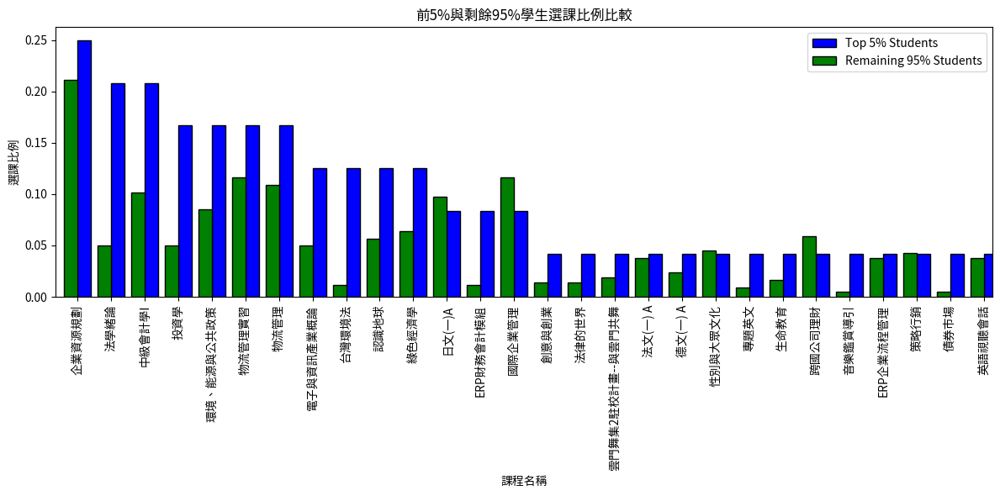

Chi-Square Statistic: 6.32506349194
P-value: 0.0119043225092


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出企業管理學系所有年級的資料
df_filtered_1 = df_1[(df_1['系所名稱'] == '企業管理學系')]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號
top_students = pd.DataFrame()
remaining_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    remaining_students_in_group = group.iloc[top_n:]  # 剩餘的95%學生
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
remaining_student_ids = remaining_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]
selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識']))]

# 計算每門課程被選擇的次數
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

# 篩選出同時被前5%和剩餘95%學生選的課程
common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
course_counts_top_common = course_counts_top[common_courses]
course_counts_remaining_common = course_counts_remaining[common_courses]

# 計算所有前5%學生和剩餘95%學生的總數
total_top_students = len(top_student_ids)
total_remaining_students = len(remaining_student_ids)

# 計算比例
course_proportions_top_common = course_counts_top_common / total_top_students
course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

# 繪製柱狀圖
fig, ax = plt.subplots(figsize=(12, 6))

# 確保只有前5%學生選過的課程才會被繪製
course_proportions_top_common = course_proportions_top_common[course_proportions_top_common > 0]

# 繪製前5%學生的選課比例
course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')

# 繪製剩餘95%學生的選課比例
course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')

plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('前5%與剩餘95%學生選課比例比較')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

from scipy.stats import chi2_contingency

# 建立交叉表
contingency_table = pd.crosstab(
    index=[df_2['學號'].isin(top_student_ids)],
    columns=df_2['課程屬性名稱'],
    values=df_2['課程名稱'],
    aggfunc='count'
)

# 進行卡方檢定
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

# 輸出結果
print("Chi-Square Statistic:", chi2)
print("P-value:", p_value)


同一學期同院不同年級的卷哥。以10201管理學院(企管、資管、經濟、財金)不同年級

<ipython-input-9-c64170e3d146>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


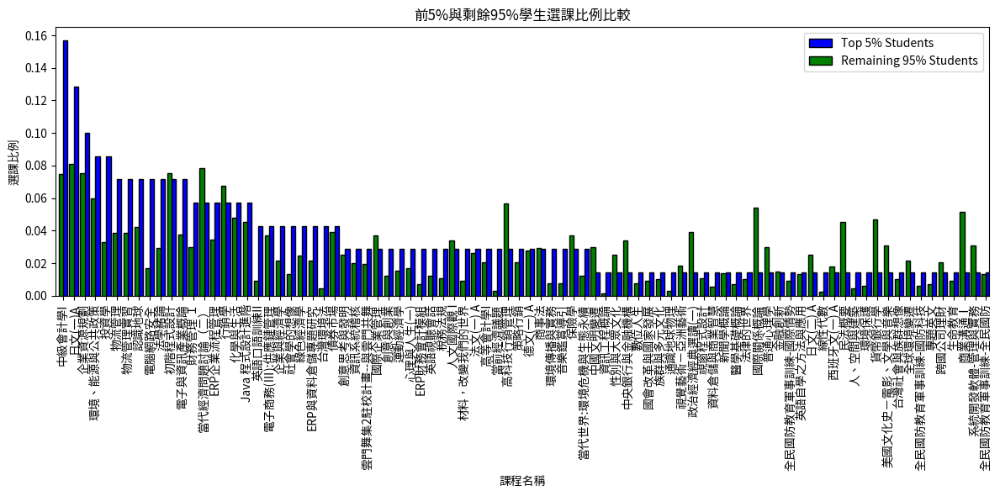

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出特定幾個系的所有年級的資料
departments = ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系']
df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號和剩餘95%的學生學號
top_students = pd.DataFrame()
remaining_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    remaining_students_in_group = group.iloc[top_n:]  # 剩餘的95%學生
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
remaining_student_ids = remaining_students['學號'].tolist()

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['人工退選','停修']))]
selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['停修','人工退選']))]

# 計算每門課程被選擇的次數
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

# 篩選出同時被前5%和剩餘95%學生選的課程
common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
course_counts_top_common = course_counts_top[common_courses]
course_counts_remaining_common = course_counts_remaining[common_courses]

# 計算所有前5%學生和剩餘95%學生的總數
total_top_students = len(top_student_ids)
total_remaining_students = len(remaining_student_ids)

# 計算比例
course_proportions_top_common = course_counts_top_common / total_top_students
course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

# 繪製柱狀圖
fig, ax = plt.subplots(figsize=(12, 6))

# 確保只有前5%學生選過的課程才會被繪製
course_proportions_top_common = course_proportions_top_common[course_proportions_top_common > 0]

# 繪製前5%學生的選課比例
course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')

# 繪製剩餘95%學生的選課比例
course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')

plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('前5%與剩餘95%學生選課比例比較')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


從剩餘95%中隨機抽出與前5%相同數量的學生，做比較
需要統計分析以確認此做法合理性，例如使用p value去判斷。

<ipython-input-10-a18f30511aed>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


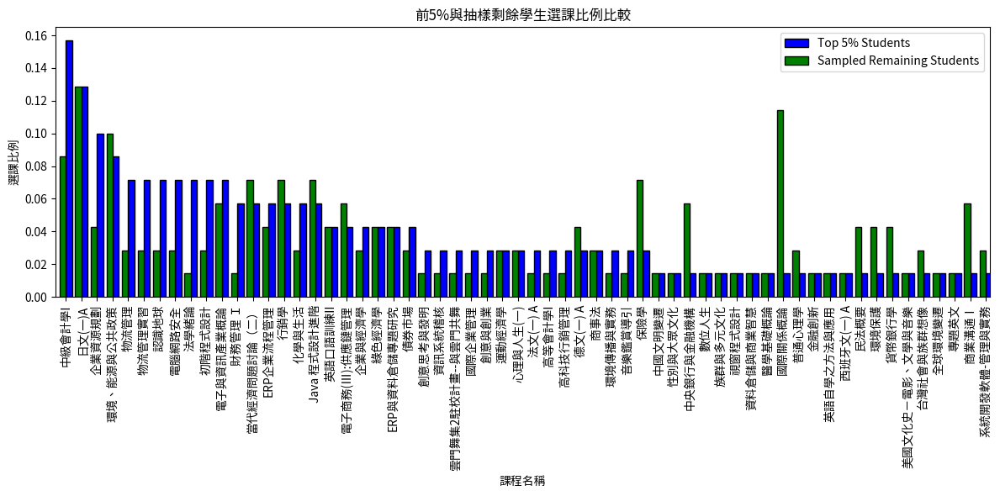

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出特定幾個系的所有年級的資料
departments = ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系']
df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號和剩餘95%的學生學號
top_students = pd.DataFrame()
remaining_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    remaining_students_in_group = group.iloc[top_n:]
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
remaining_student_ids = remaining_students['學號'].tolist()

# 隨機抽取與前5%學生數量相同的學生數量
sampled_remaining_student_ids = np.random.choice(remaining_student_ids, size=len(top_student_ids), replace=False)

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['人工退選','停修']))]
selected_courses_remaining = df_2[(df_2['學號'].isin(sampled_remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['停修','人工退選']))]

# 計算每門課程被選擇的次數
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

# 篩選出同時被前5%和剩餘95%學生選的課程
common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
course_counts_top_common = course_counts_top[common_courses]
course_counts_remaining_common = course_counts_remaining[common_courses]

# 計算比例
course_proportions_top_common = course_counts_top_common / len(top_student_ids)
course_proportions_remaining_common = course_counts_remaining_common / len(sampled_remaining_student_ids)

# 繪製柱狀圖
fig, ax = plt.subplots(figsize=(12, 6))
course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Sampled Remaining Students')

plt.xlabel('課程名稱')
plt.ylabel('選課比例')
plt.title('前5%與抽樣剩餘學生選課比例比較')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


所有學生的選課比例圖、前百分之五的學生選課比例圖、剩餘95%的學生選課比例圖，圖中標記平均的選課比率和計算選課比率的標準差。第一張圖為空白，因為實在是太凌亂了。


<ipython-input-11-38760c3ca8a7>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')
<ipython-input-11-38760c3ca8a7>:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


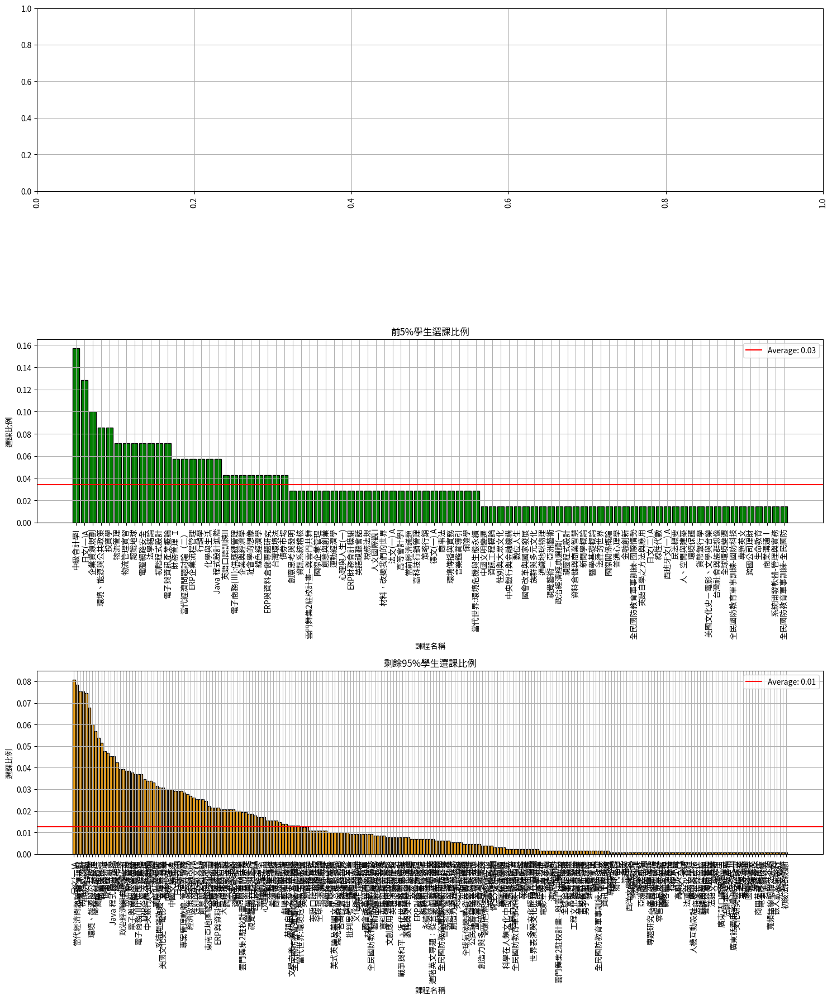

所有學生選課比例的標準差: 0.00
前5%學生選課比例的標準差: 0.03
剩餘95%學生選課比例的標準差: 0.02


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 讀取第一份CSV文件
url_1 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_1021(01).csv"
df_1 = pd.read_csv(url_1)

# 篩選出特定幾個系的所有年級的資料
departments = ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系']
df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]

# 確保'學期-班一般人數'列是數字類型
df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')

# 處理NaN值
df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

# 找出前5%的學生學號和剩餘95%的學生學號
top_students = pd.DataFrame()
remaining_students = pd.DataFrame()
for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
    top_n = max(int(round(len(group) * 0.05)), 1)
    top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
    remaining_students_in_group = group.iloc[top_n:]
    top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

# 獲取學號列表
top_student_ids = top_students['學號'].tolist()
remaining_student_ids = remaining_students['學號'].tolist()

# 隨機抽取與前5%學生數量相同的學生數量
# sampled_remaining_student_ids = np.random.choice(remaining_student_ids, size=len(top_student_ids), replace=False)

# 讀取第二份CSV文件
url_2 = "https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_1021(01).csv"
df_2 = pd.read_csv(url_2)

# 篩選出學號對應的課程名稱和學分數，並且課程屬性名稱為選修或通識
selected_courses = df_2[(df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['人工退選','停修']))]
selected_courses_top = selected_courses[selected_courses['學號'].isin(top_student_ids)]
selected_courses_remaining = selected_courses[selected_courses['學號'].isin(remaining_student_ids)]

# 計算每門課程被選擇的次數
course_counts = selected_courses['課程名稱'].value_counts()
course_counts_top = selected_courses_top['課程名稱'].value_counts()
course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

# 計算比例
course_proportions = course_counts / len(df_2['學號'].unique())
course_proportions_top = course_counts_top / len(top_student_ids)
course_proportions_remaining = course_counts_remaining / len(remaining_student_ids)

# 繪製柱狀圖
fig, axs = plt.subplots(3, 1, figsize=(15, 18))

# 所有學生
# axs[0].bar(course_proportions.index, course_proportions, color='blue')
# axs[0].axhline(y=course_proportions.mean(), color='r', linestyle='-', label=f'Average: {course_proportions.mean():.2f}')
# axs[0].set_title('所有學生選課比例')
# axs[0].set_xlabel('課程名稱')
# axs[0].set_ylabel('選課比例')
# axs[0].legend()

# 前5%學生
axs[1].bar(course_proportions_top.index, course_proportions_top, color='green')
axs[1].axhline(y=course_proportions_top.mean(), color='r', linestyle='-', label=f'Average: {course_proportions_top.mean():.2f}')
axs[1].set_title('前5%學生選課比例')
axs[1].set_xlabel('課程名稱')
axs[1].set_ylabel('選課比例')
axs[1].legend()

# 剩餘95%學生
axs[2].bar(course_proportions_remaining.index, course_proportions_remaining, color='orange')
axs[2].axhline(y=course_proportions_remaining.mean(), color='r', linestyle='-', label=f'Average: {course_proportions_remaining.mean():.2f}')
axs[2].set_title('剩餘95%學生選課比例')
axs[2].set_xlabel('課程名稱')
axs[2].set_ylabel('選課比例')
axs[2].legend()

# 調整圖表
for ax in axs:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.grid(True)

plt.tight_layout()
plt.show()

# 計算標準差
std_all_students = course_proportions.std()
std_top_students = course_proportions_top.std()
std_remaining_students = course_proportions_remaining.std()

print(f"所有學生選課比例的標準差: {std_all_students:.2f}")
print(f"前5%學生選課比例的標準差: {std_top_students:.2f}")
print(f"剩餘95%學生選課比例的標準差: {std_remaining_students:.2f}")




不同學期管理學院的不同年級書卷獎都選擇那些課程。

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


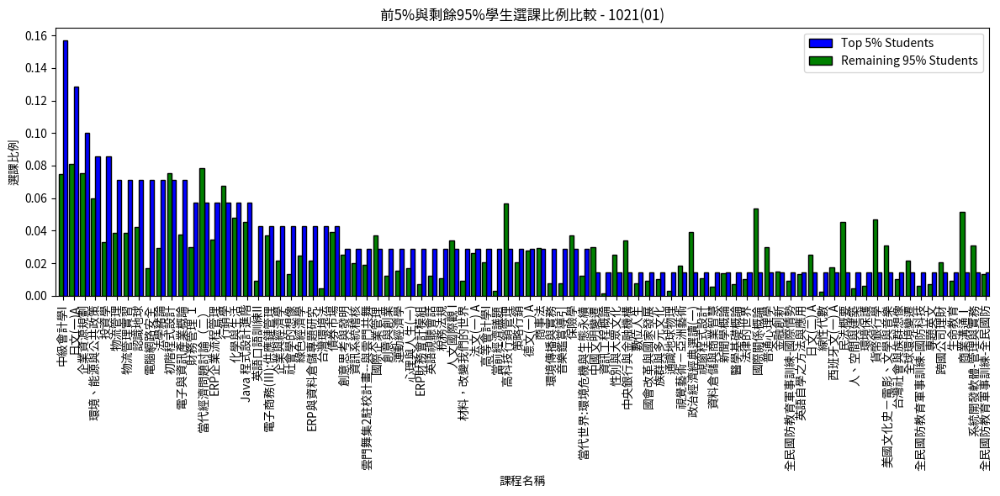

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


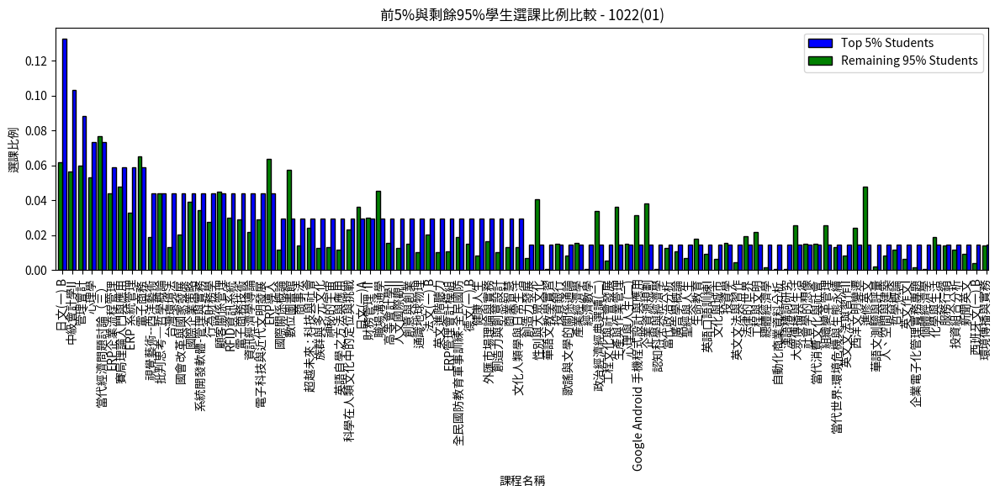

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


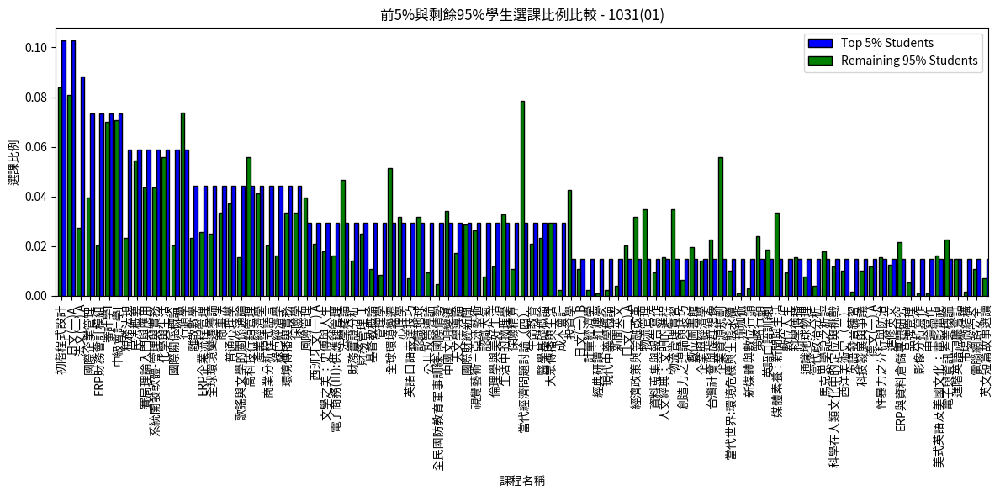

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


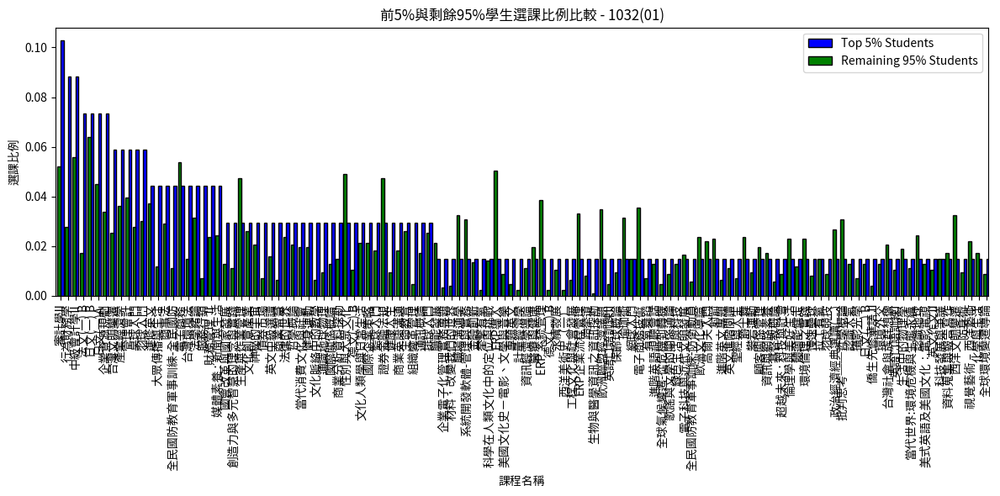

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


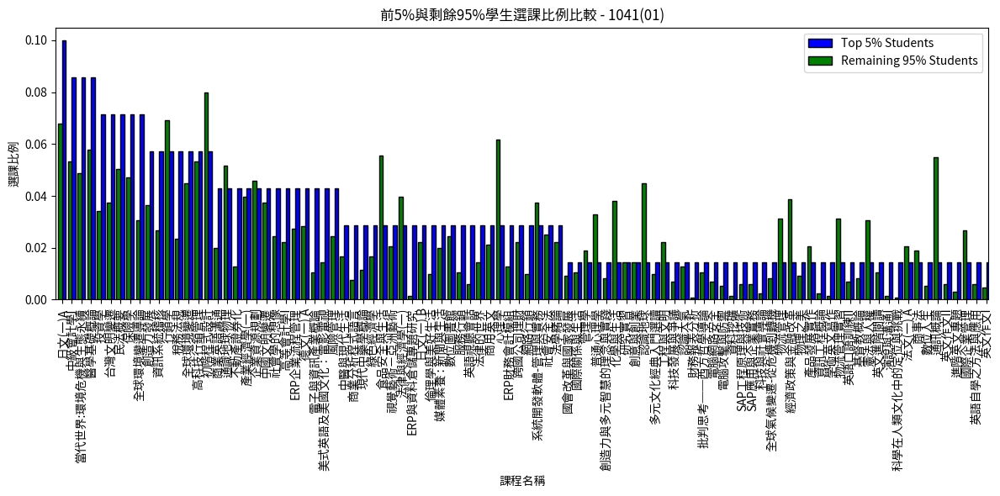

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


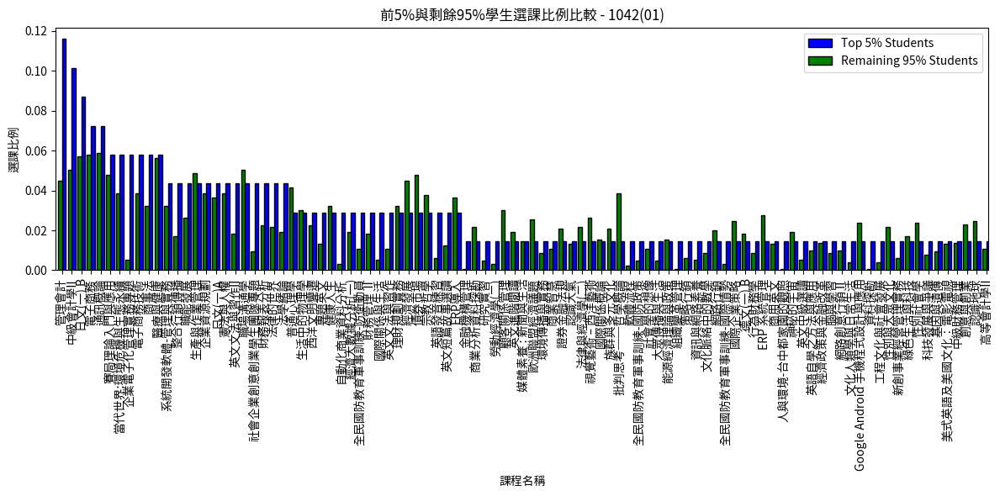

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


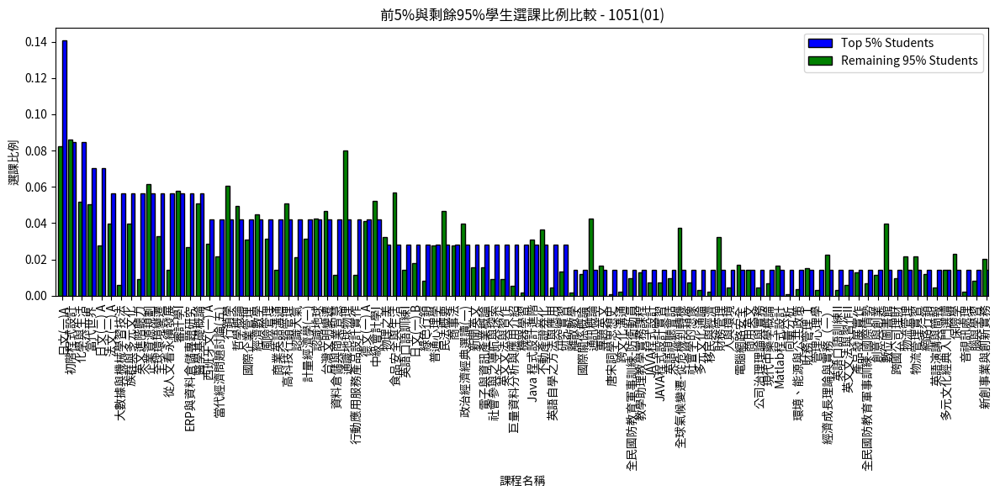

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


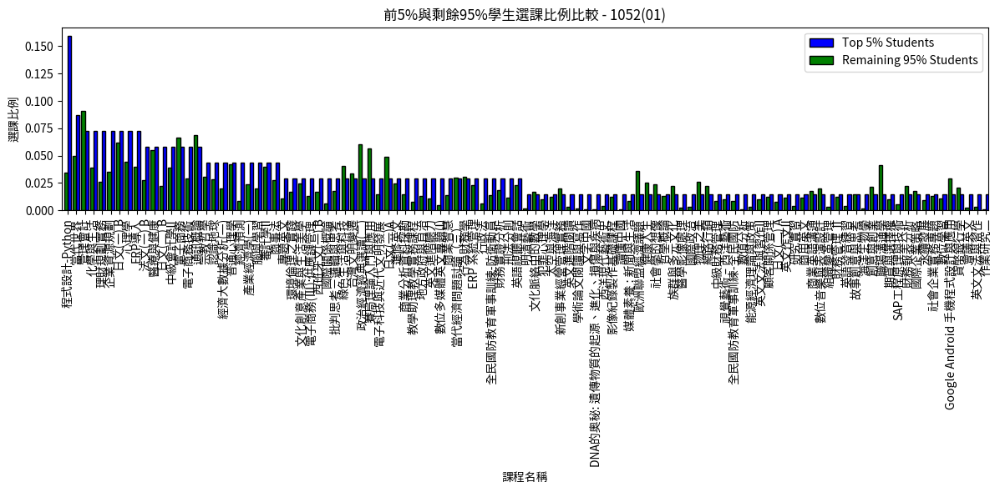

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


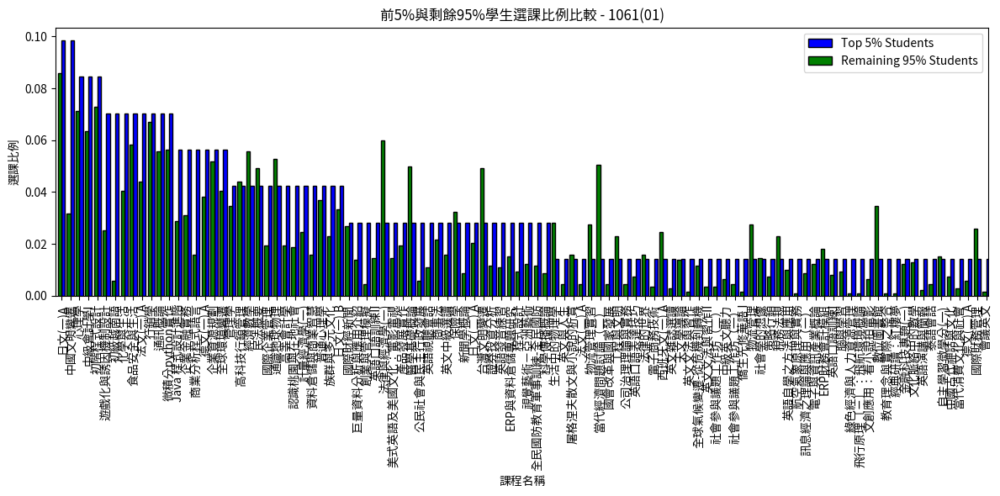

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


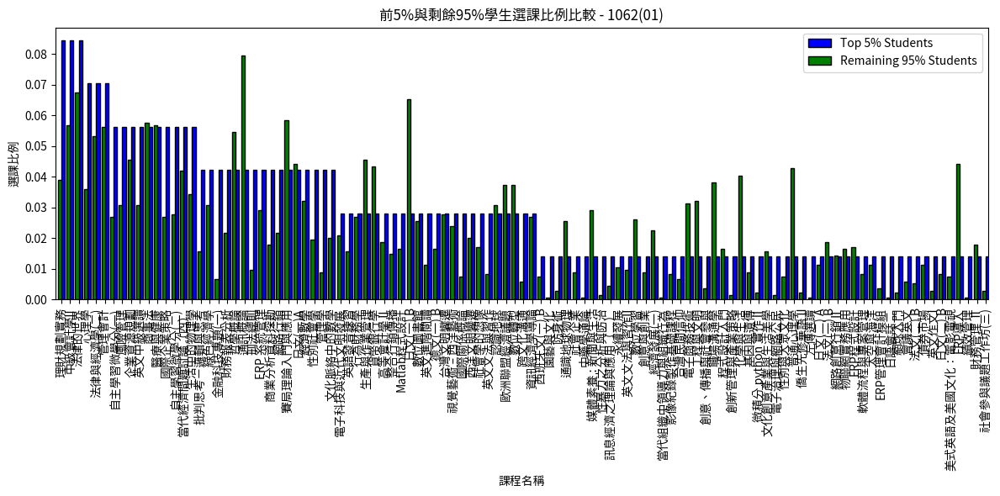

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


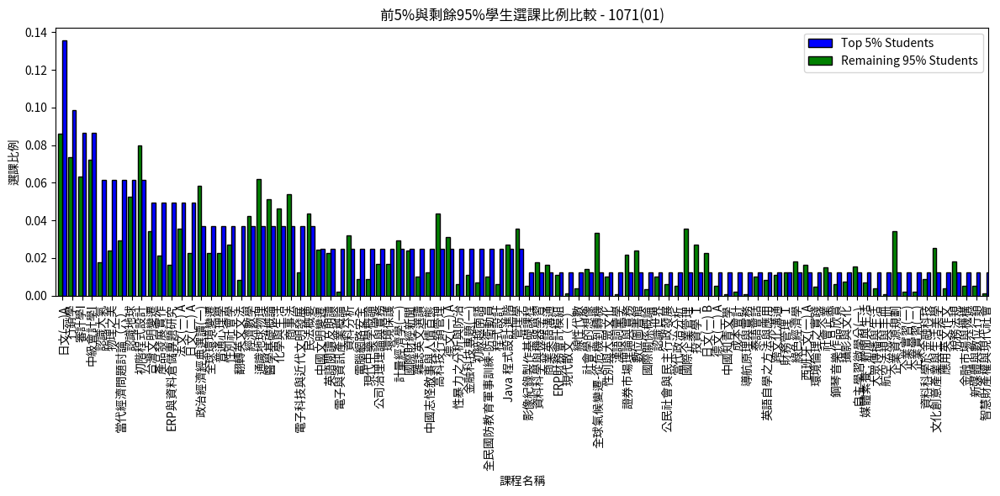

<ipython-input-12-f85a323eff60>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


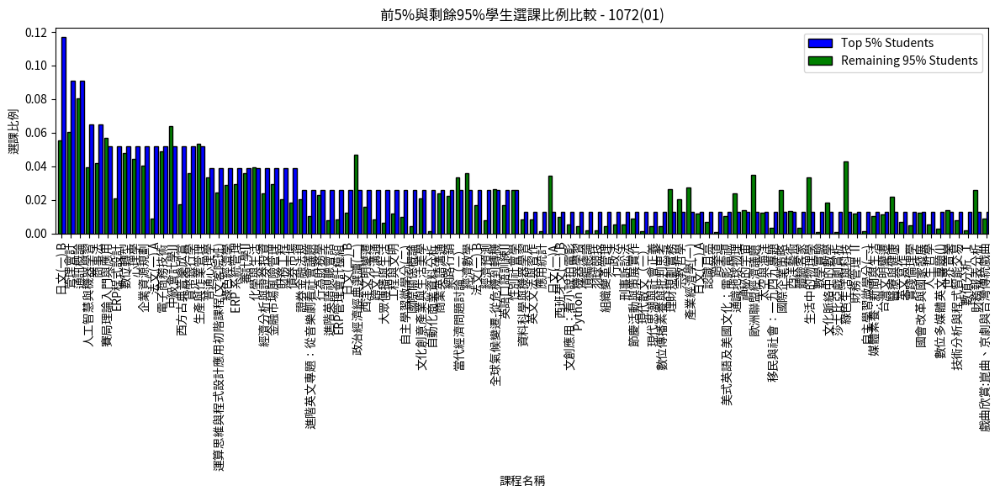

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 學期列表
semesters = ["1021(01)", "1022(01)", "1031(01)", "1032(01)", "1041(01)", "1042(01)", "1051(01)", "1052(01)", "1061(01)", "1062(01)", "1071(01)", "1072(01)"]

# 指定系所
departments = ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系']

# 對每個學期進行分析
for semester in semesters:
    # 讀取學期平均成績資料
    url_1 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_{semester}.csv"
    df_1 = pd.read_csv(url_1)
    df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]
    df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')
    df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

    # 找出前5%的學生學號和剩餘95%的學生學號
    top_students = pd.DataFrame()
    remaining_students = pd.DataFrame()
    for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
        top_n = max(int(round(len(group) * 0.05)), 1)
        top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
        remaining_students_in_group = group.iloc[top_n:]
        top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
        remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

    top_student_ids = top_students['學號'].tolist()
    remaining_student_ids = remaining_students['學號'].tolist()

    # 讀取選課資料
    url_2 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_{semester}.csv"
    df_2 = pd.read_csv(url_2)
    selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['人工退選','停修']))]
    selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['停修','人工退選']))]

    # 計算每門課程被選擇的次數
    course_counts_top = selected_courses_top['課程名稱'].value_counts()
    course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

    # 篩選出同時被前5%和剩餘95%學生選的課程
    common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
    course_counts_top_common = course_counts_top[common_courses]
    course_counts_remaining_common = course_counts_remaining[common_courses]

    # 計算所有前5%學生和剩餘95%學生的總數
    total_top_students = len(top_student_ids)
    total_remaining_students = len(remaining_student_ids)

    # 計算比例
    course_proportions_top_common = course_counts_top_common / total_top_students
    course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

    # 繪製柱狀圖
    fig, ax = plt.subplots(figsize=(12, 6))
    course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
    course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')
    plt.xlabel('課程名稱')
    plt.ylabel('選課比例')
    plt.title(f'前5%與剩餘95%學生選課比例比較 - {semester}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

不同學期同院不同年級的所有資料(卷哥都退啥?) 目前有一個problem，篩選出同時被前5%和剩餘95%學生選的課程，可能會有偏差的問題，目前無法解決!!!

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


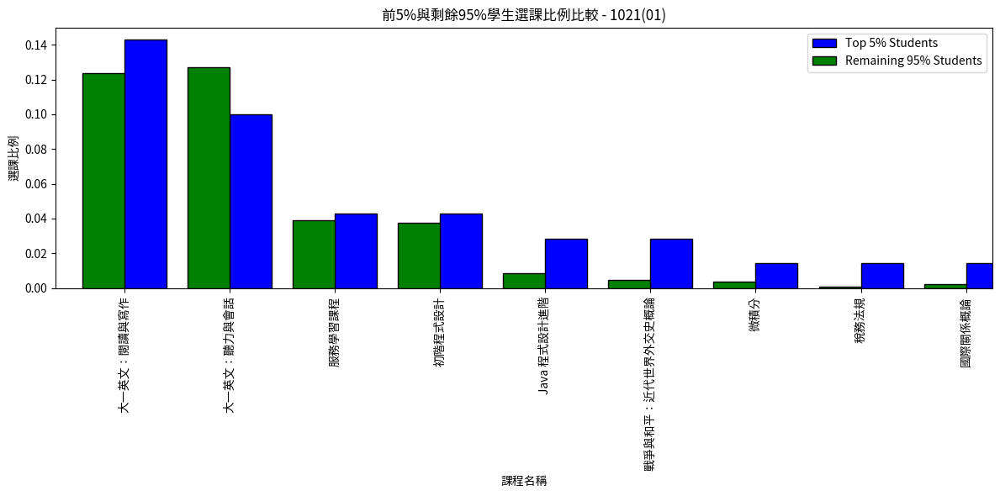

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


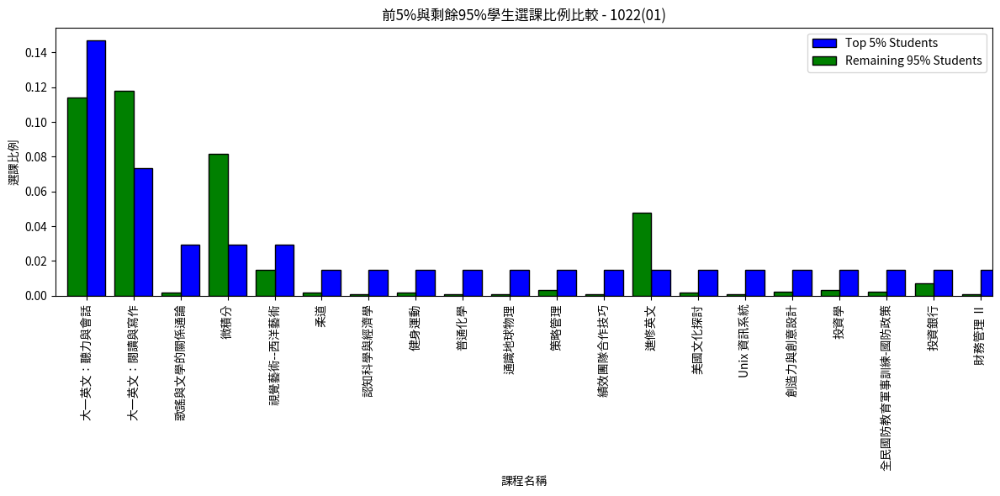

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


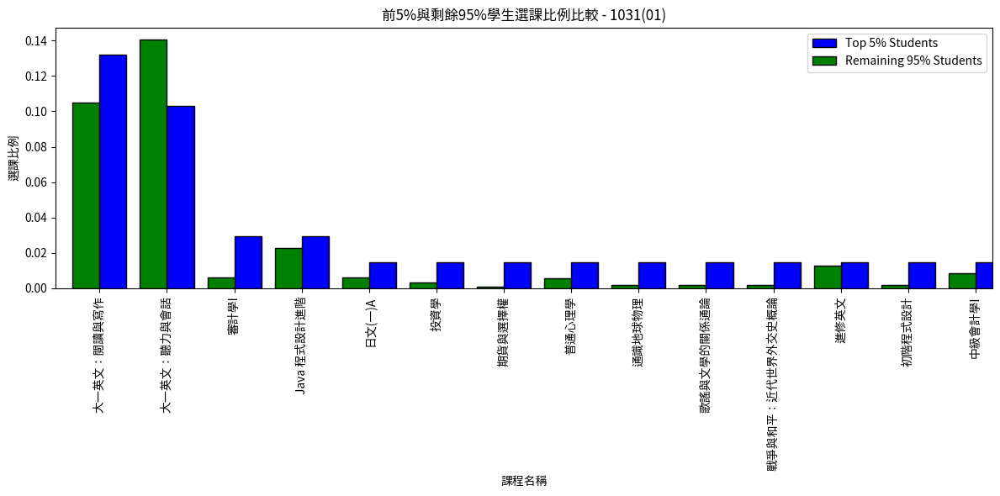

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


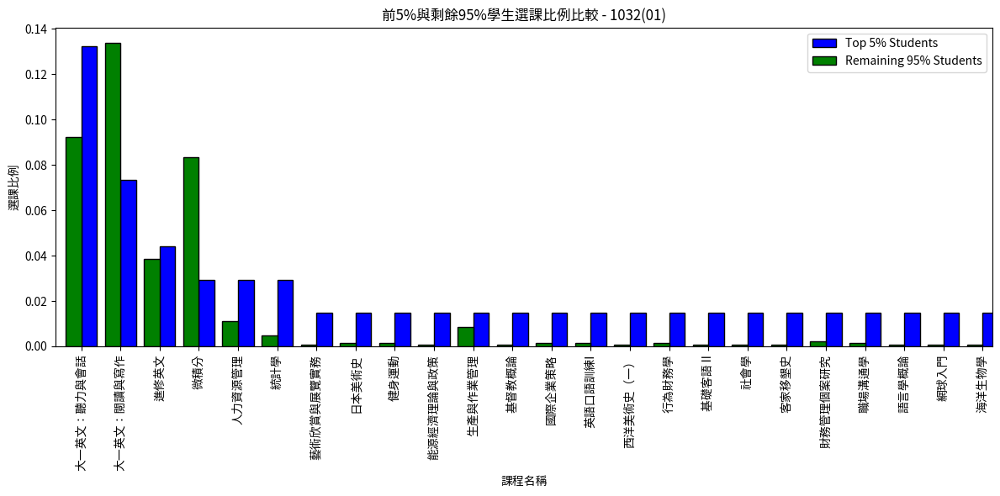

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


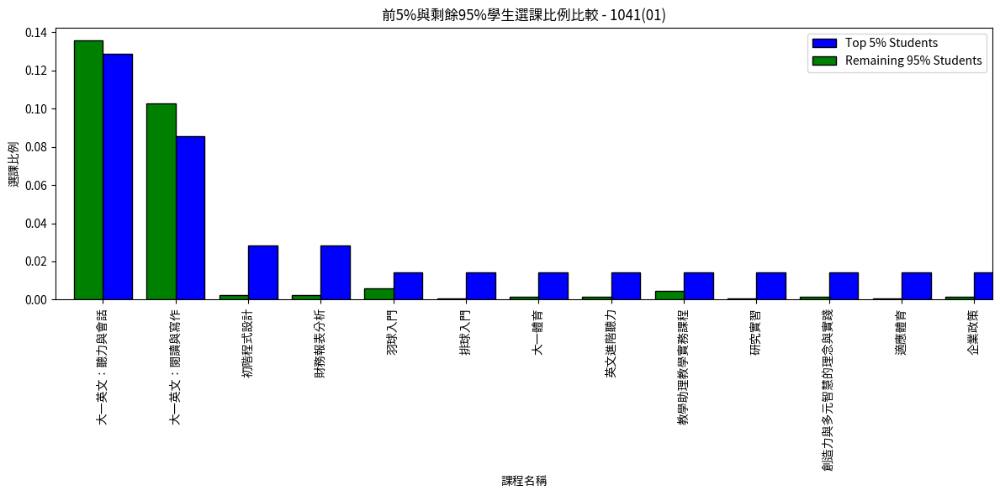

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


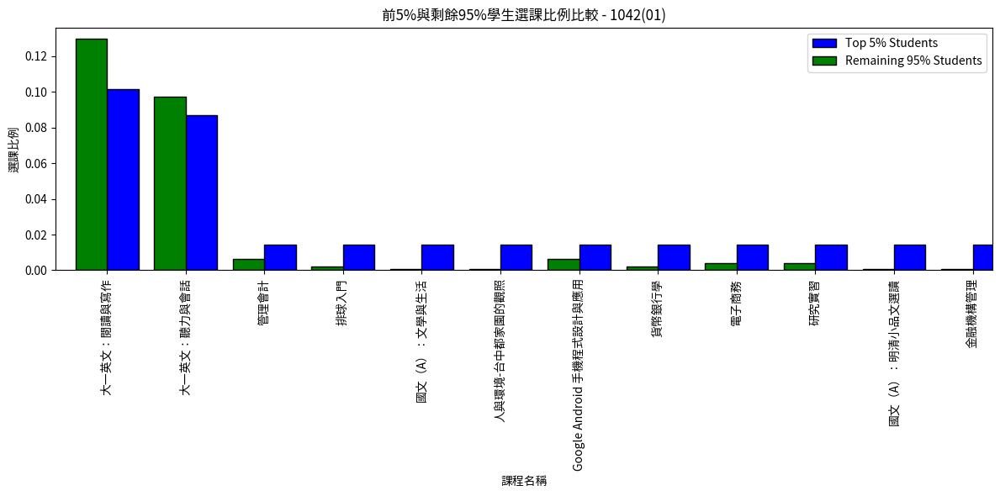

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


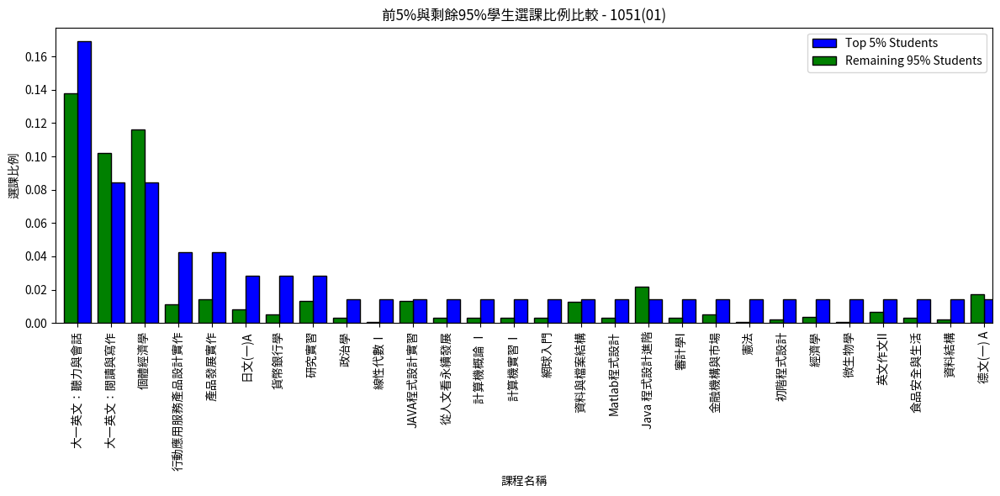

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


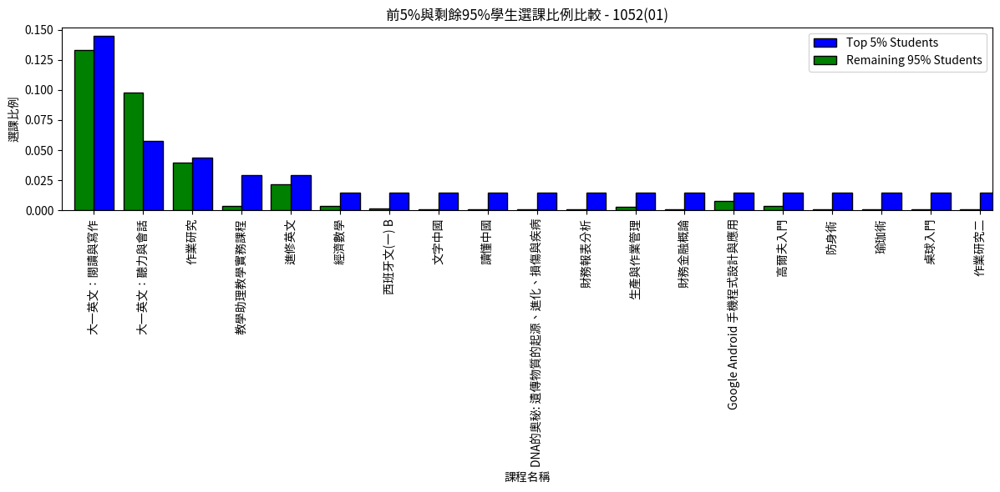

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


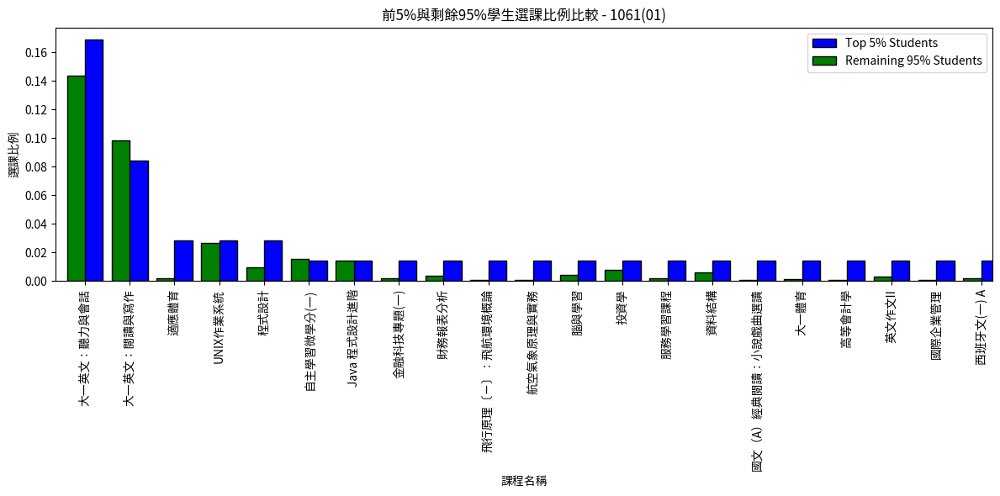

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


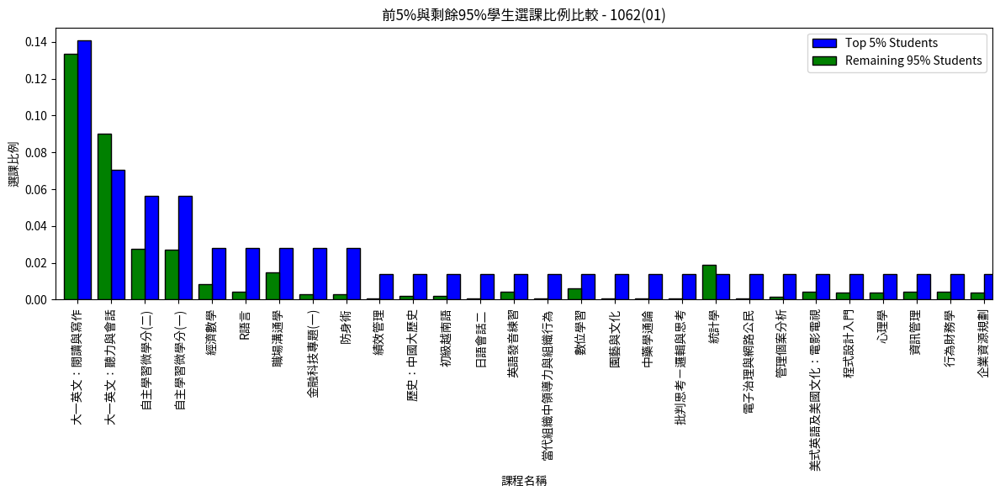

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


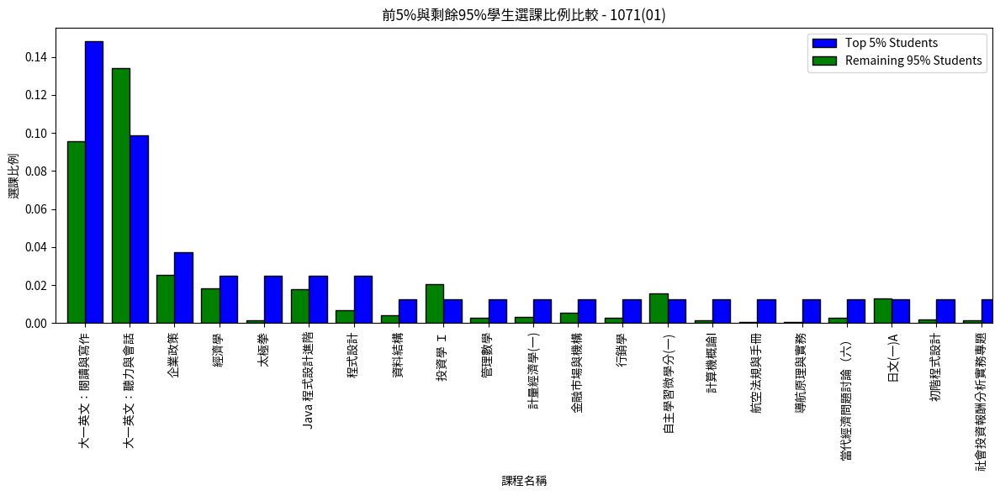

<ipython-input-13-374e361116c9>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


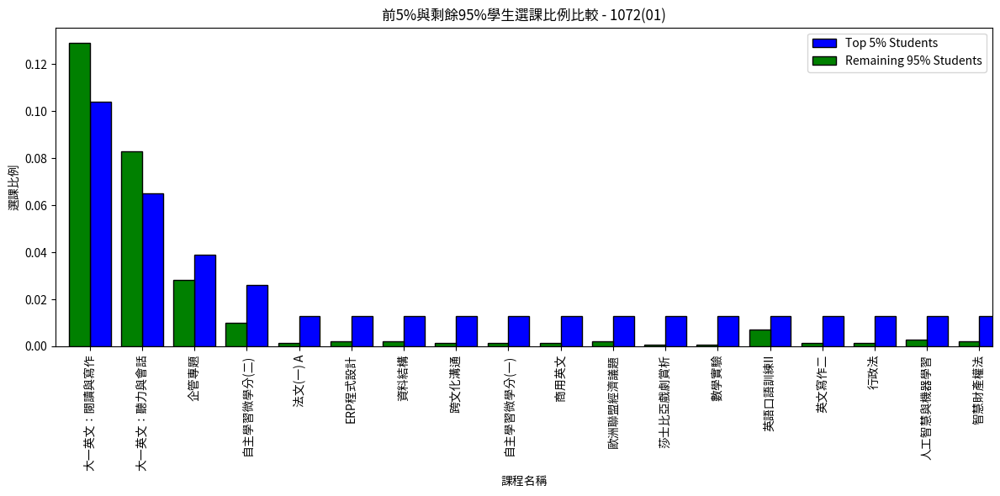

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 學期列表
semesters = ["1021(01)", "1022(01)", "1031(01)", "1032(01)", "1041(01)", "1042(01)", "1051(01)", "1052(01)", "1061(01)", "1062(01)", "1071(01)", "1072(01)"]

# 指定系所
departments = ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系']

# 對每個學期進行分析
for semester in semesters:
    # 讀取學期平均成績資料
    url_1 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_{semester}.csv"
    df_1 = pd.read_csv(url_1)
    df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]
    df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')
    df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

    # 找出前5%的學生學號和剩餘95%的學生學號
    top_students = pd.DataFrame()
    remaining_students = pd.DataFrame()
    for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
        top_n = max(int(round(len(group) * 0.05)), 1)
        top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
        remaining_students_in_group = group.iloc[top_n:]
        top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
        remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

    top_student_ids = top_students['學號'].tolist()
    remaining_student_ids = remaining_students['學號'].tolist()

    # 讀取選課資料
    url_2 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_{semester}.csv"
    df_2 = pd.read_csv(url_2)
    selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修','通識','必修'])) & (~df_2['分發結果名稱'].isin(['加退選中選','中選(初選)','密碼中選']))]
    selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識','必修'])) & (~df_2['分發結果名稱'].isin(['加退選中選','中選(初選)','密碼中選']))]

    # 計算每門課程被選擇的次數
    course_counts_top = selected_courses_top['課程名稱'].value_counts()
    course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

    # 篩選出同時被前5%和剩餘95%學生選的課程  #可能會有偏差的問題，目前無法解決!!!
    common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
    course_counts_top_common = course_counts_top[common_courses]
    course_counts_remaining_common = course_counts_remaining[common_courses]

    # 計算所有前5%學生和剩餘95%學生的總數
    total_top_students = len(top_student_ids)
    total_remaining_students = len(remaining_student_ids)

    # 計算比例
    course_proportions_top_common = course_counts_top_common / total_top_students
    course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

    # 繪製柱狀圖
    fig, ax = plt.subplots(figsize=(12, 6))
    course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
    course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')
    plt.xlabel('課程名稱')
    plt.ylabel('選課比例')
    plt.title(f'前5%與剩餘95%學生選課比例比較 - {semester}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()



一樣有偏差問題，待解決~

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


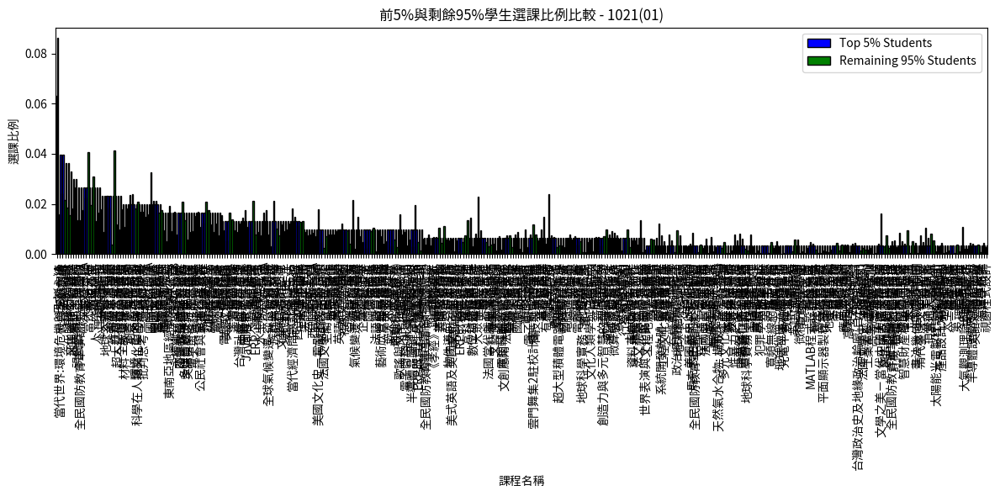

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


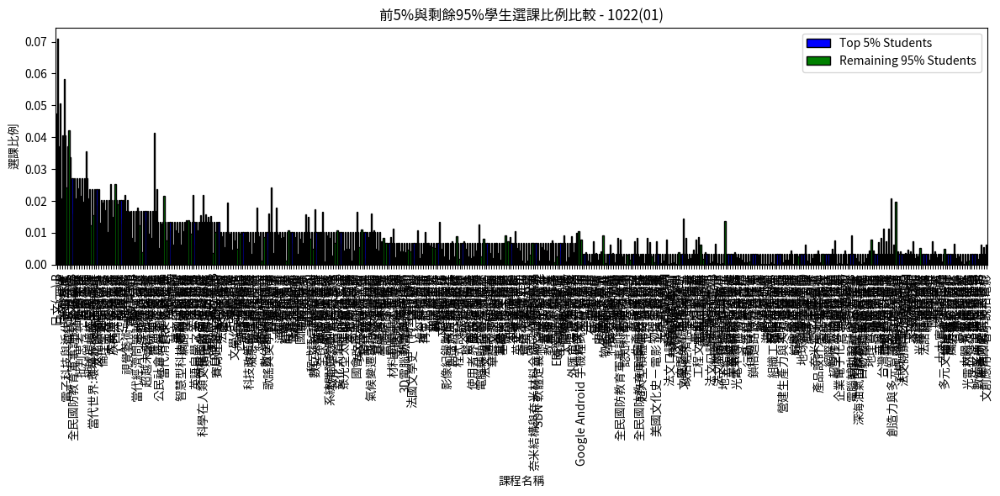

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


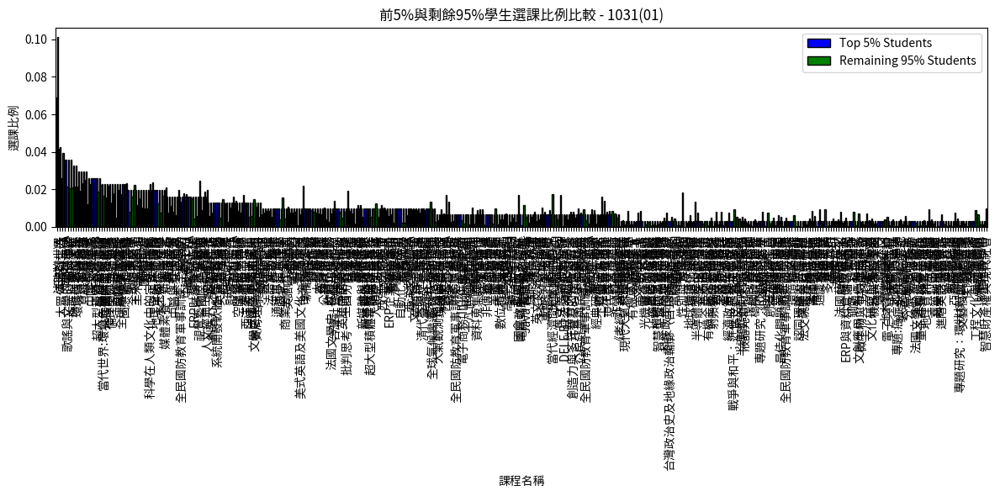

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


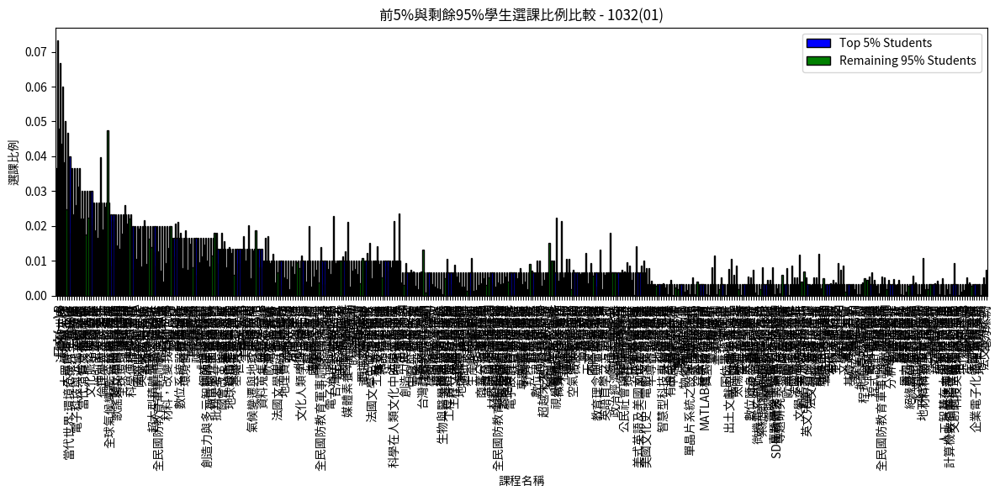

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


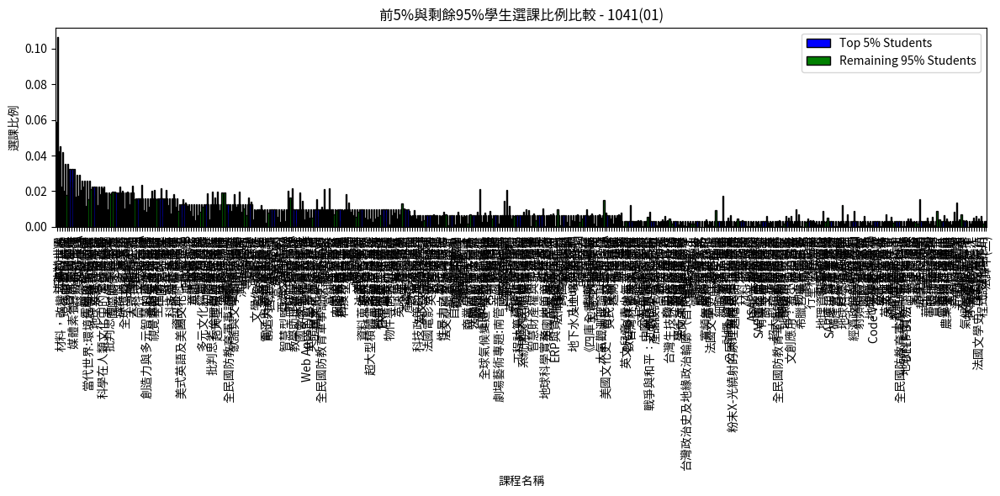

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


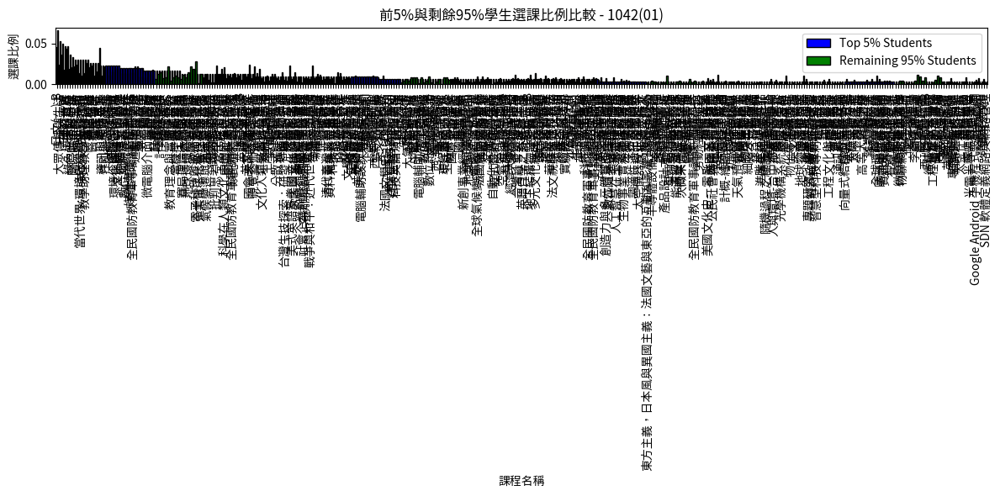

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


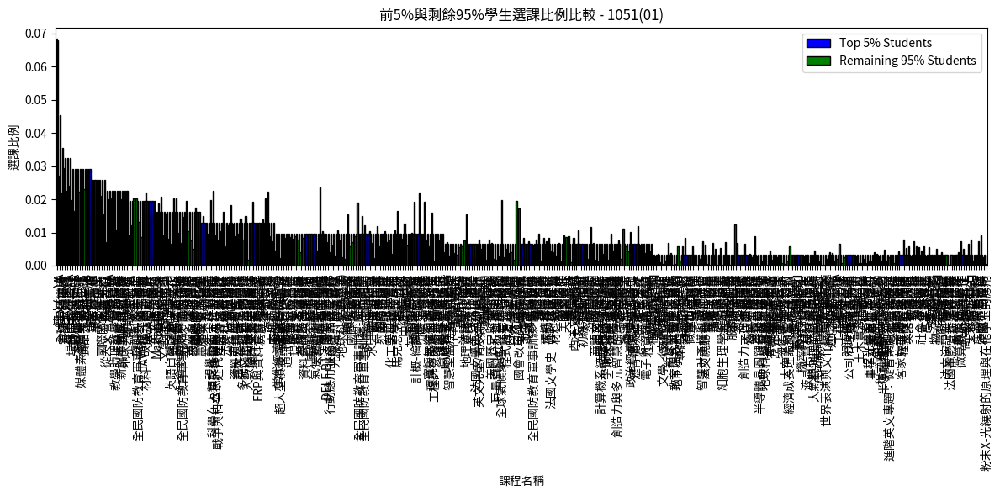

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


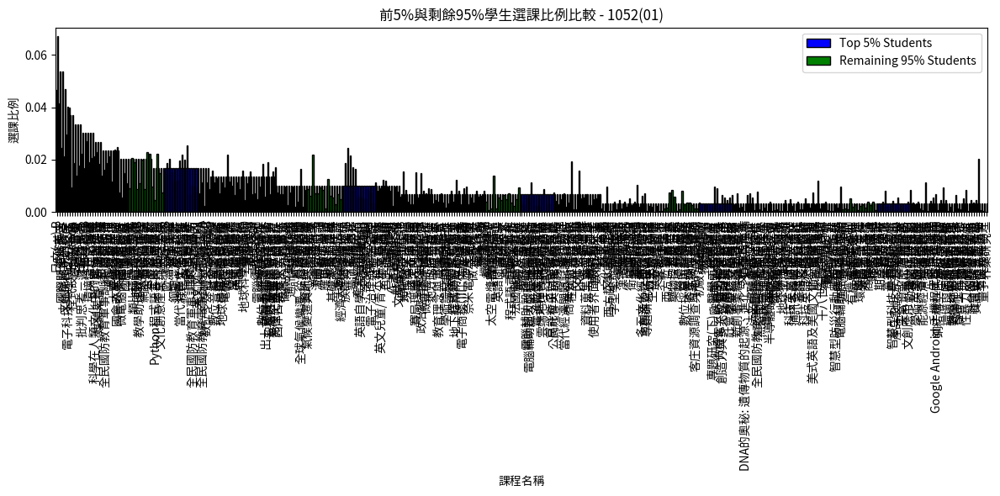

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


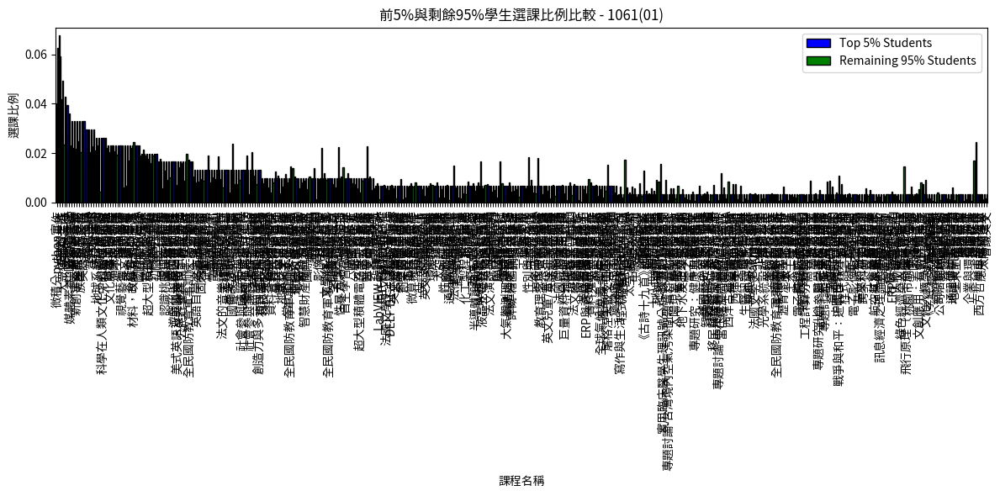

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


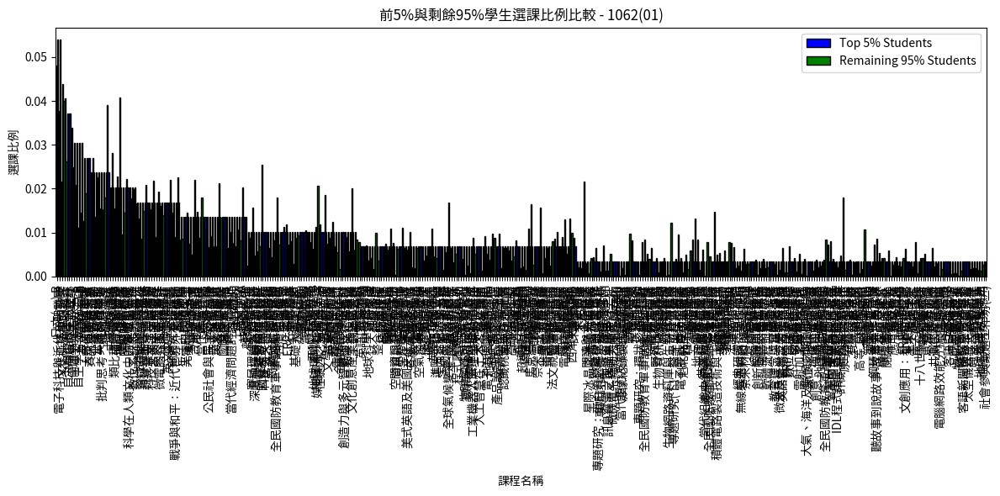

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


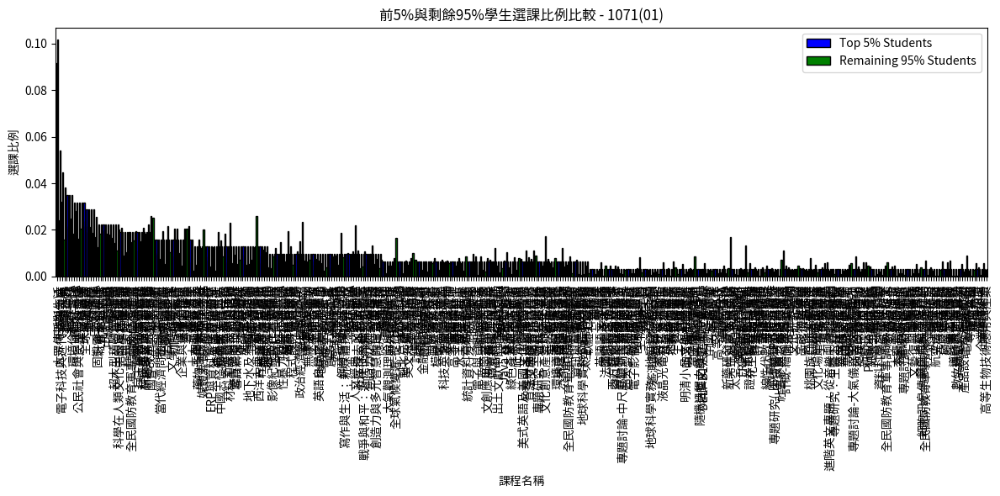

<ipython-input-14-da8e36ef7bee>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


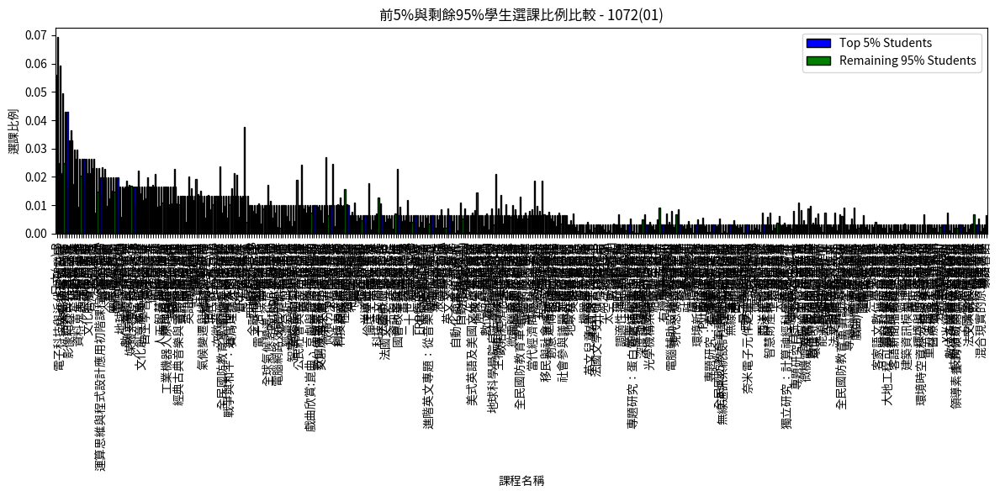

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 學期列表
semesters = ["1021(01)", "1022(01)", "1031(01)", "1032(01)", "1041(01)", "1042(01)", "1051(01)", "1052(01)", "1061(01)", "1062(01)", "1071(01)", "1072(01)"]

# 指定系所
departments = [
    '文學院學士班', '中國文學系', '英美語文學系', '法國語文學系',
    '理學院學士班', '物理學系', '數學系', '化學學系', '光電科學與工程學系',
    '工學院學士班', '化學工程與材料工程學系', '土木工程學系', '機械工程學系',
    '企業管理學系', '資訊管理學系', '財務金融學系', '經濟學系',
    '資訊電機學院學士班', '電機工程學系', '資訊工程學系', '通訊工程學系',
    '地球科學學院學士班', '地球科學學系', '大氣科學學系', '太空科學與工程學系',
    '客家語文暨社會科學學系', '生命科學系', '生醫科學與工程學系'
]

# 對每個學期進行分析
for semester in semesters:
    # 讀取學期平均成績資料
    url_1 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_{semester}.csv"
    df_1 = pd.read_csv(url_1)
    df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]
    df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')
    df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

    # 找出前5%的學生學號和剩餘95%的學生學號
    top_students = pd.DataFrame()
    remaining_students = pd.DataFrame()
    for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
        top_n = max(int(round(len(group) * 0.05)), 1)
        top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
        remaining_students_in_group = group.iloc[top_n:]
        top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
        remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

    top_student_ids = top_students['學號'].tolist()
    remaining_student_ids = remaining_students['學號'].tolist()

    # 讀取選課資料
    url_2 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_{semester}.csv"
    df_2 = pd.read_csv(url_2)
    selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['人工退選','停修']))]
    selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識'])) & (~df_2['分發結果名稱'].isin(['停修','人工退選']))]

    # 計算每門課程被選擇的次數
    course_counts_top = selected_courses_top['課程名稱'].value_counts()
    course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

    # 篩選出同時被前5%和剩餘95%學生選的課程
    common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
    course_counts_top_common = course_counts_top[common_courses]
    course_counts_remaining_common = course_counts_remaining[common_courses]

    # 計算所有前5%學生和剩餘95%學生的總數
    total_top_students = len(top_student_ids)
    total_remaining_students = len(remaining_student_ids)

    # 計算比例
    course_proportions_top_common = course_counts_top_common / total_top_students
    course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

    # 繪製柱狀圖
    fig, ax = plt.subplots(figsize=(12, 6))
    course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
    course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')
    plt.xlabel('課程名稱')
    plt.ylabel('選課比例')
    plt.title(f'前5%與剩餘95%學生選課比例比較 - {semester}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

針對全校102-107學年的所有資料進行分析。

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


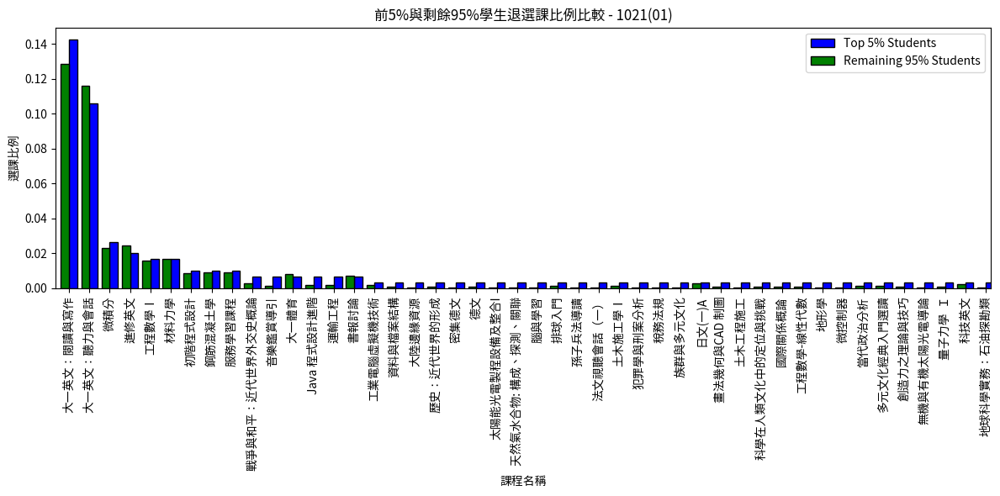

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


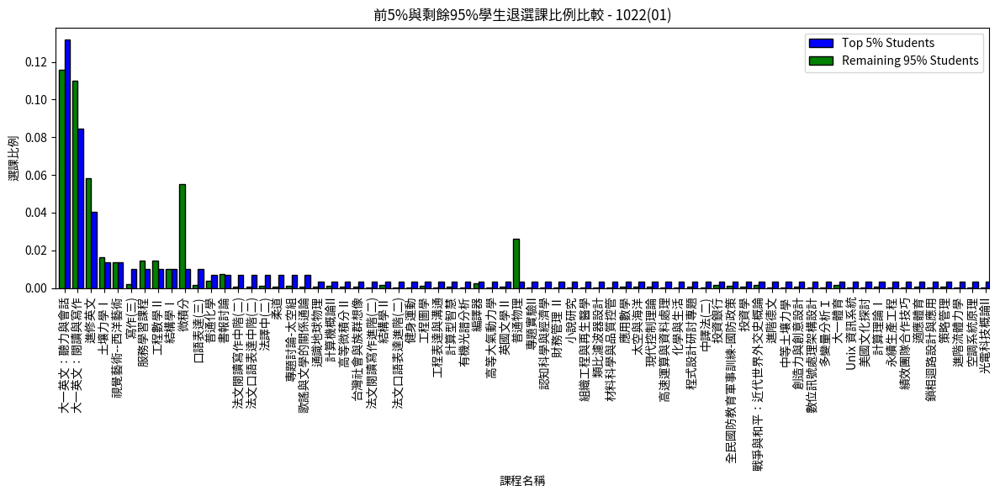

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


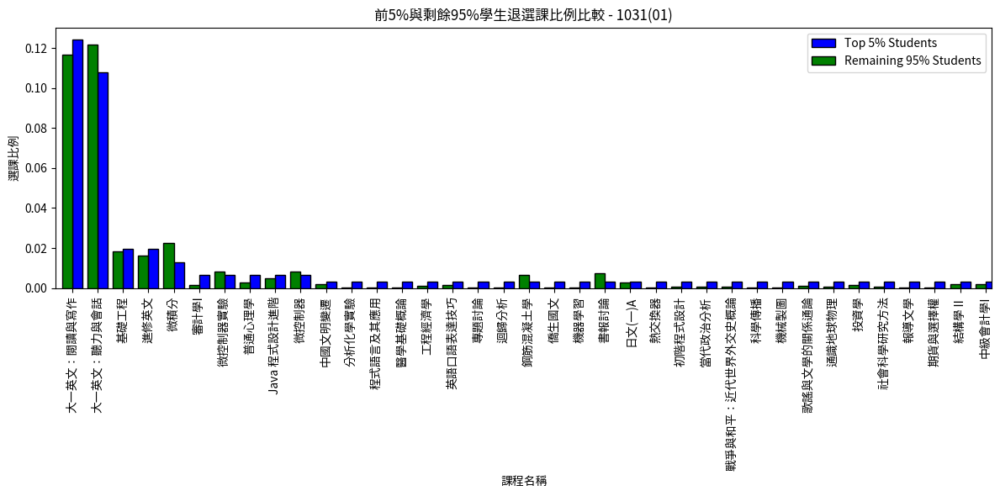

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


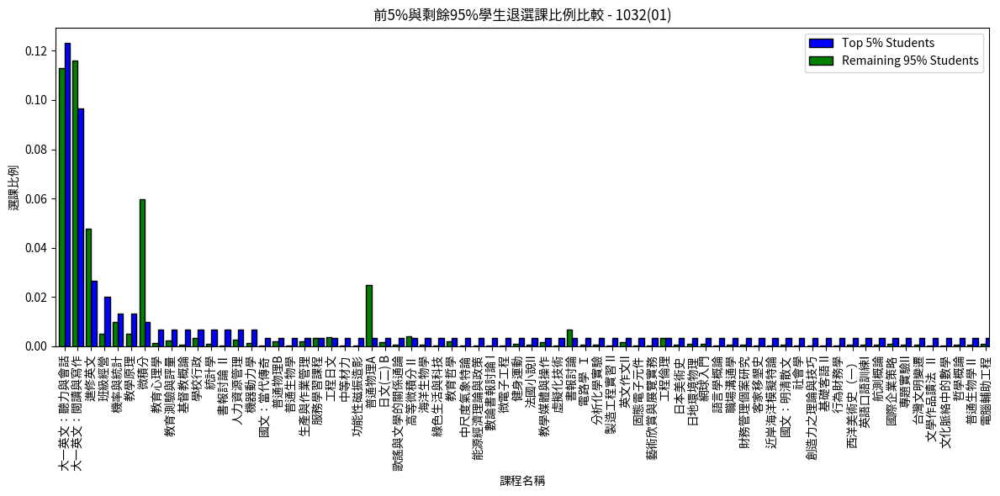

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


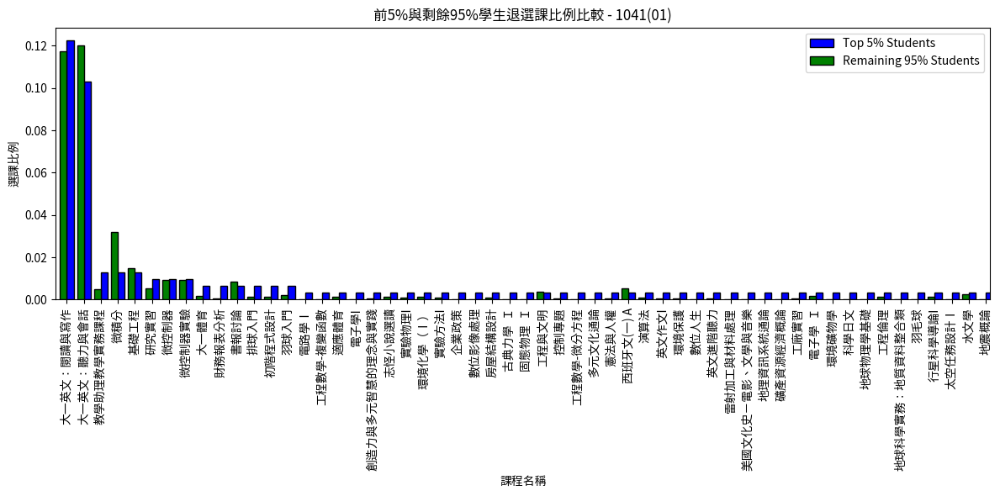

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


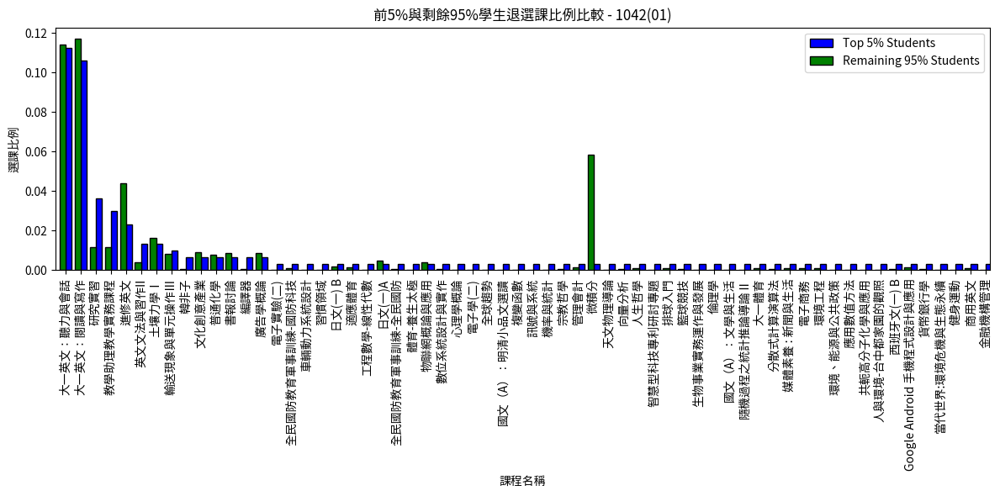

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


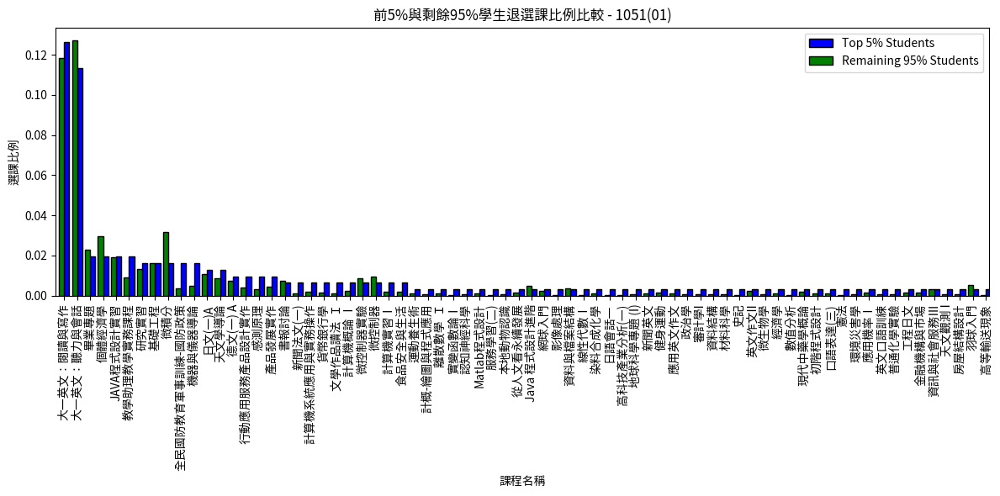

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


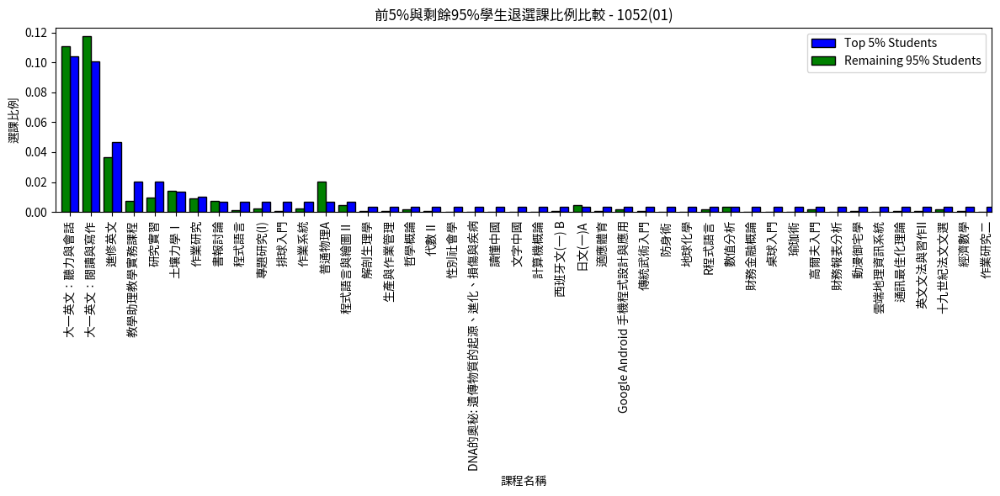

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


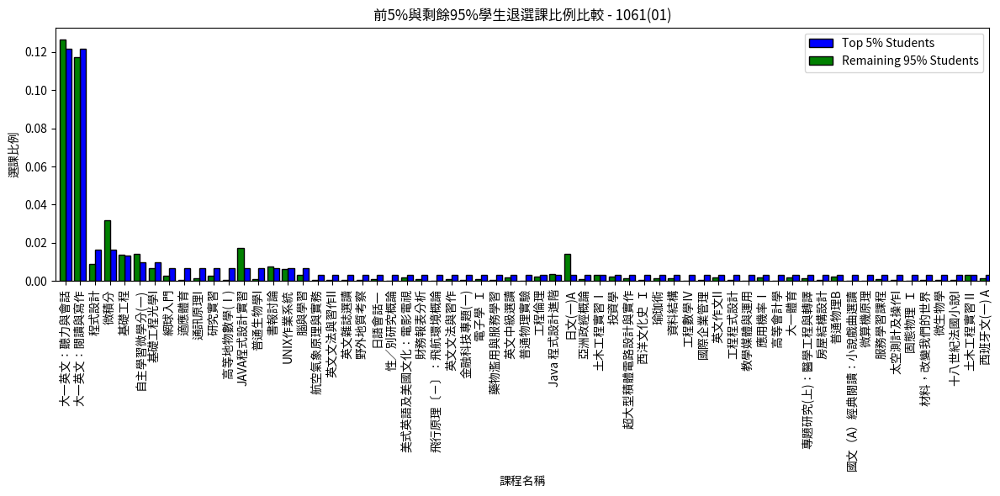

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


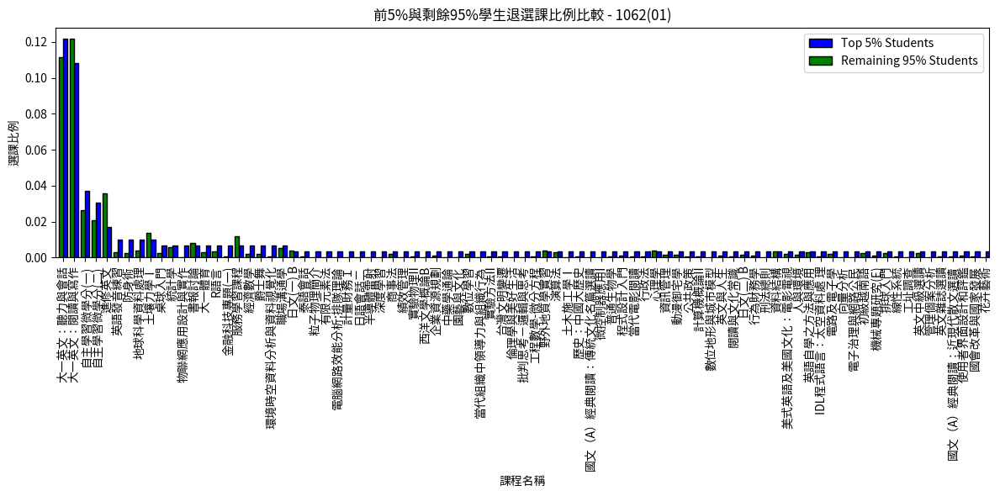

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


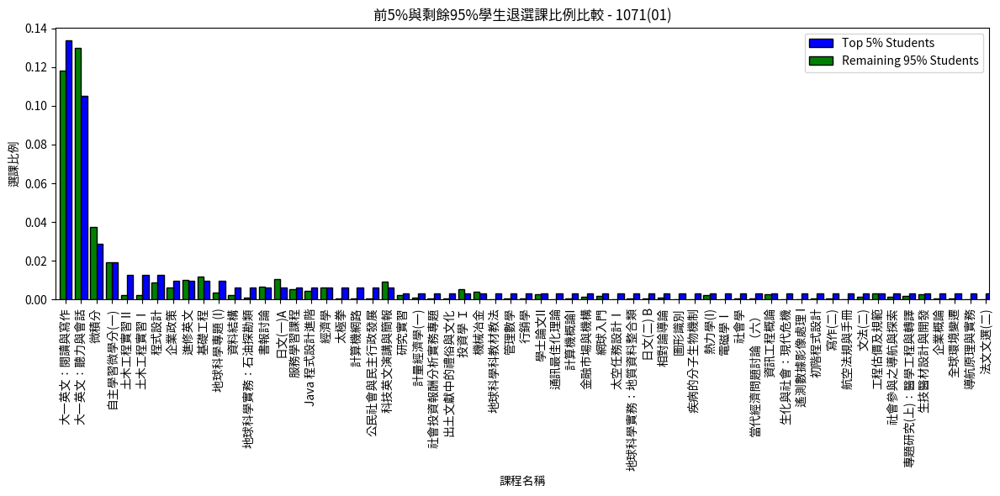

<ipython-input-16-f69f75fc106d>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')


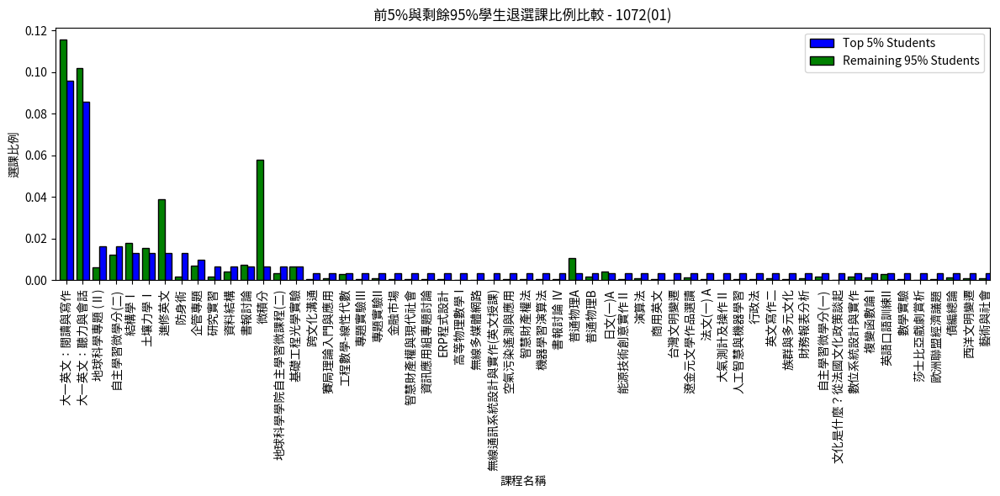

Chi-Square Statistic: 8.89116512741
P-value: 0.00286553815886


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 學期列表
semesters = ["1021(01)", "1022(01)", "1031(01)", "1032(01)", "1041(01)", "1042(01)", "1051(01)", "1052(01)", "1061(01)", "1062(01)", "1071(01)", "1072(01)"]

# 指定系所
departments = [
    '文學院學士班', '中國文學系', '英美語文學系', '法國語文學系',
    '理學院學士班', '物理學系', '數學系', '化學學系', '光電科學與工程學系',
    '工學院學士班', '化學工程與材料工程學系', '土木工程學系', '機械工程學系',
    '企業管理學系', '資訊管理學系', '財務金融學系', '經濟學系',
    '資訊電機學院學士班', '電機工程學系', '資訊工程學系', '通訊工程學系',
    '地球科學學院學士班', '地球科學學系', '大氣科學學系', '太空科學與工程學系',
    '客家語文暨社會科學學系', '生命科學系', '生醫科學與工程學系'
]

# 對每個學期進行分析
for semester in semesters:
    # 讀取學期平均成績資料
    url_1 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_{semester}.csv"
    df_1 = pd.read_csv(url_1)
    df_filtered_1 = df_1[df_1['系所名稱'].isin(departments)]
    df_filtered_1['學期-班一般人數'] = pd.to_numeric(df_filtered_1['學期-班一般人數'], errors='coerce')
    df_filtered_1 = df_filtered_1.dropna(subset=['學期-班一般人數', '學期-班一般名次'])

    # 找出前5%的學生學號和剩餘95%的學生學號
    top_students = pd.DataFrame()
    remaining_students = pd.DataFrame()
    for (dept, year_class), group in df_filtered_1.groupby(['系所名稱', '年級班別']):
        top_n = max(int(round(len(group) * 0.05)), 1)
        top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
        remaining_students_in_group = group.iloc[top_n:]
        top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
        remaining_students = pd.concat([remaining_students, remaining_students_in_group], ignore_index=True)

    top_student_ids = top_students['學號'].tolist()
    remaining_student_ids = remaining_students['學號'].tolist()

    # 讀取選課資料
    url_2 = f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_{semester}.csv"
    df_2 = pd.read_csv(url_2)
    selected_courses_top = df_2[(df_2['學號'].isin(top_student_ids)) & (df_2['課程屬性名稱'].isin(['選修','通識','必修'])) & (~df_2['分發結果名稱'].isin(['加退選中選','中選(初選)','密碼中選']))]
    selected_courses_remaining = df_2[(df_2['學號'].isin(remaining_student_ids)) & (df_2['課程屬性名稱'].isin(['選修', '通識','必修'])) & (~df_2['分發結果名稱'].isin(['加退選中選','中選(初選)','密碼中選']))]

    # 計算每門課程被選擇的次數
    course_counts_top = selected_courses_top['課程名稱'].value_counts()
    course_counts_remaining = selected_courses_remaining['課程名稱'].value_counts()

    # 篩選出同時被前5%和剩餘95%學生選的課程
    common_courses = course_counts_top.index.intersection(course_counts_remaining.index)
    course_counts_top_common = course_counts_top[common_courses]
    course_counts_remaining_common = course_counts_remaining[common_courses]

    # 計算所有前5%學生和剩餘95%學生的總數
    total_top_students = len(top_student_ids)
    total_remaining_students = len(remaining_student_ids)

    # 計算比例
    course_proportions_top_common = course_counts_top_common / total_top_students
    course_proportions_remaining_common = course_counts_remaining_common / total_remaining_students

    # 繪製柱狀圖
    fig, ax = plt.subplots(figsize=(12, 6))
    course_proportions_top_common.plot(kind='bar', color='blue', position=0, width=0.4, label='Top 5% Students')
    course_proportions_remaining_common.plot(kind='bar', color='green', position=1, width=0.4, label='Remaining 95% Students')
    plt.xlabel('課程名稱')
    plt.ylabel('選課比例')
    plt.title(f'前5%與剩餘95%學生退選課比例比較 - {semester}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

print(f"所有學期中，{display_department} {formatted_year_classes}的前 5% 學生最喜歡的課程:")
print(f"所有學期中，{display_department} {formatted_year_classes}的前 5% 學生最不喜歡的課程:")

使用者輸入：允許用戶輸入系所名稱和年級班別。

數據匹配與提取：基於用戶輸入，從數據集中過濾出匹配的學生。

識別前 5% 學生：根據成績計算每個系所、年級中前 5% 的學生。

選課記錄查詢：對這些頂尖學生的選課記錄進行分析。
顯示結果：將選過次數最多的前十名課程以適當的格式展示給用戶。

![image.png](
  
)


In [ ]:
import pandas as pd

# 定義學期列表
semesters = ["1021(01)", "1022(01)", "1031(01)", "1032(01)", "1041(01)", "1042(01)", "1051(01)", "1052(01)", "1061(01)", "1062(01)", "1071(01)", "1072(01)"]

# 学院与系所的映射
college_departments = {
    "管理學院": ['企業管理學系', '資訊管理學系', '經濟學系', '財務金融學系'],
    "文學院": ['文學院學士班', '中國文學系', '英美語文學系', '法國語文學系'],
    "理學院": ['理學院學士班', '物理學系', '數學系', '化學學系', '光電科學與工程學系'],
    "工學院": ['工學院學士班', '化學工程與材料工程學系', '土木工程學系', '機械工程學系'],
    "資訊電機學院": ['資訊電機學院學士班', '電機工程學系', '資訊工程學系', '通訊工程學系'],
    "地球科學學院": ['地球科學學院學士班', '地球科學學系', '大氣科學學系', '太空科學與工程學系'],
    "客家學院": ['客家語文暨社會科學學系'],
    "生醫學院": ['生命科學系', '生醫科學與工程學系'],
    "全校": ['文學院學士班', '中國文學系', '英美語文學系', '法國語文學系',
    '理學院學士班', '物理學系', '數學系', '化學學系', '光電科學與工程學系',
    '工學院學士班', '化學工程與材料工程學系', '土木工程學系', '機械工程學系',
    '企業管理學系', '資訊管理學系', '財務金融學系', '經濟學系',
    '資訊電機學院學士班', '電機工程學系', '資訊工程學系', '通訊工程學系',
    '地球科學學院學士班', '地球科學學系', '大氣科學學系', '太空科學與工程學系',
    '客家語文暨社會科學學系', '生命科學系', '生醫科學與工程學系'],

}

def get_top_student_ids(df_scores, departments, year_classes, top_percentage=0.05):
    # 解析年级字符串，如 "12" 解析为 ["1年级", "2年级"]
    parsed_year_classes = [f"{year}年級" for year in year_classes]

    # 找出指定系所和年级的前5%学生
    top_students = pd.DataFrame()
    for (dept, yc), group in df_scores.groupby(['系所名稱', '年級班別']):
        if dept in departments and any(yc.startswith(year_class) for year_class in parsed_year_classes):
            top_n = max(int(round(len(group) * top_percentage)), 1)
            top_students_in_group = group.nsmallest(top_n, '學期-班一般名次')
            top_students = pd.concat([top_students, top_students_in_group], ignore_index=True)
    return top_students['學號'].tolist()


# 使用者輸入
input_department = input("請輸入系所名稱或学院名稱: ")  # 例如: 企業管理學系 或 管理學院
year_classes_input = input("請輸入年級班別: ")


def format_year_classes(input_str):
    # 将输入字符串如 "123" 转换为 "1, 2, 3年级"
    return ', '.join([f"{year}年級" for year in input_str])

# 输出格式化部分
formatted_year_classes = format_year_classes(year_classes_input)

# 检查输入是学院还是具体系所，并获取相应的系所列表
if input_department in college_departments:
    departments_to_search = college_departments[input_department]
    display_department = input_department  # 学院名称
else:
    departments_to_search = [input_department]
    display_department = input_department  # 系所名称

# 初始化一個空的 DataFrame 來存儲所有學期的選課記錄
all_semesters_selected_courses = pd.DataFrame()

# 初始化一個空的 DataFrame 來存儲所有學期的退課記錄
all_semesters_withdraw_courses = pd.DataFrame()

# 循環處理每個學期
for semester in semesters:
    df_scores = pd.read_csv(f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E5%AD%B8%E6%9C%9F%E5%B9%B3%E5%9D%87%E6%88%90%E7%B8%BE_{semester}.csv")
    df_courses = pd.read_csv(f"https://raw.githubusercontent.com/JackyYang27/data-science-and-big-data/main/dataset/112-0004_%E6%A0%A1%E5%8B%99%E6%8B%8B%E8%BD%89%E8%B3%87%E6%96%99_%E5%AD%B8%E7%94%9F%E9%81%B8%E8%AA%B2%E6%88%90%E7%B8%BE%E8%B3%87%E6%96%99_{semester}.csv")

    # 根据系所列表过滤数据
    df_filtered_scores = df_scores[df_scores['系所名稱'].isin(departments_to_search)]

    # 獲取前5%學生的學號
    top_student_ids = get_top_student_ids(df_filtered_scores, departments_to_search, year_classes_input)

    # 從選課資料中過濾這些學生的選課記錄，只包括選修和通識課程，並排除人工退選和停修的情況
    selected_courses = df_courses[(df_courses['學號'].isin(top_student_ids)) & (df_courses['課程屬性名稱'].isin(['選修', '通識'])) & (~df_courses['分發結果名稱'].isin(['人工退選', '停修']))]

    # 從選課資料中過濾這些學生的選課記錄，退選的課
    withdraw_courses = df_courses[(df_courses['學號'].isin(top_student_ids)) & (df_courses['分發結果名稱'].isin(['人工退選', '停修'])) & (df_courses['課程屬性名稱'].isin(['必修','選修', '通識']))]

    # 將選課記錄添加到匯總的 DataFrame
    all_semesters_selected_courses = pd.concat([all_semesters_selected_courses, selected_courses])
    all_semesters_withdraw_courses = pd.concat([all_semesters_withdraw_courses,  withdraw_courses])



# 計算每門課程被選擇的次數，並取前十名
top_selected_courses = all_semesters_selected_courses['課程名稱'].value_counts().head(10)

# 計算每門課程被退選的次數，並取前十名
top_withdraw_courses = all_semesters_withdraw_courses['課程名稱'].value_counts().head(100)


print(f"所有學期中，{display_department} {formatted_year_classes}的前 5% 學生最喜歡的課程:")
print(top_selected_courses)
print()
print(f"所有學期中，{display_department} {formatted_year_classes}的前 5% 學生最不喜歡的課程:")
print(top_withdraw_courses)